## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "language_it"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "language"
target_positive_class = "it"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6875
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6727
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6137
Epoch 21 Validation Loss: 0.6635
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5831
Epoch 31 Validation Loss: 0.6587
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5567
Epoch 41 Validation Loss: 0.6573
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 47
Loss history saved to trainings/language_it/loss_history.json


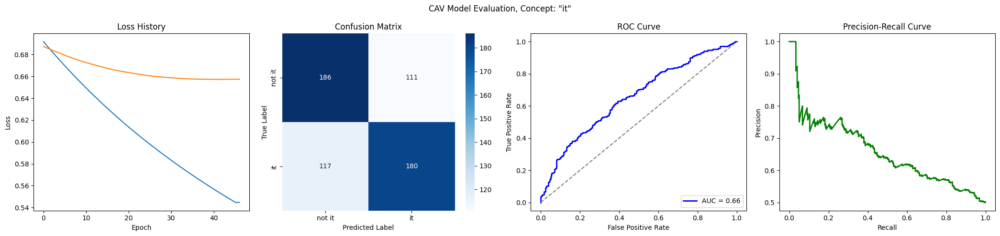

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6471
Epoch 11 Validation Loss: 0.6801
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6065
Epoch 21 Validation Loss: 0.6722
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5729
Epoch 31 Validation Loss: 0.6662
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5452
Epoch 41 Validation Loss: 0.6641
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5217
Epoch 51 Validation Loss: 0.6632
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5201
Epoch 61 Validation Loss: 0.6631
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5201
Epoch 71 Validation Loss: 0.6631
Early stopping at ep

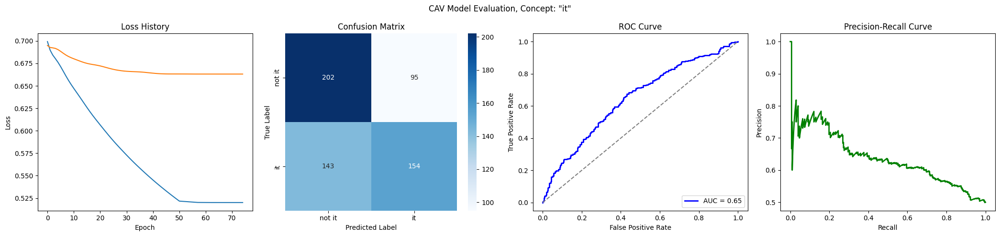

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6505
Epoch 11 Validation Loss: 0.6603
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6156
Epoch 21 Validation Loss: 0.6370
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5868
Epoch 31 Validation Loss: 0.6182
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5625
Epoch 41 Validation Loss: 0.6032
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5412
Epoch 51 Validation Loss: 0.5919
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5223
Epoch 61 Validation Loss: 0.5836
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5052
Epoch 71 Validation Loss: 0.5776
Model saved to train

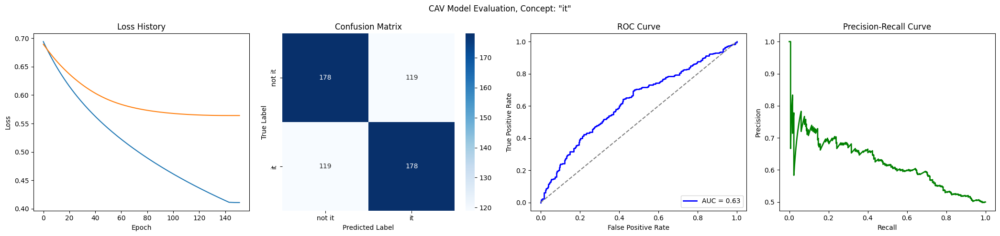

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6861
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6518
Epoch 11 Validation Loss: 0.6681
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6132
Epoch 21 Validation Loss: 0.6550
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5811
Epoch 31 Validation Loss: 0.6461
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5540
Epoch 41 Validation Loss: 0.6403
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5306
Epoch 51 Validation Loss: 0.6367
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5098
Epoch 61 Validation Loss: 0.6347
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4910
Epoch 71 Validation Loss: 0.6339
Model saved to train

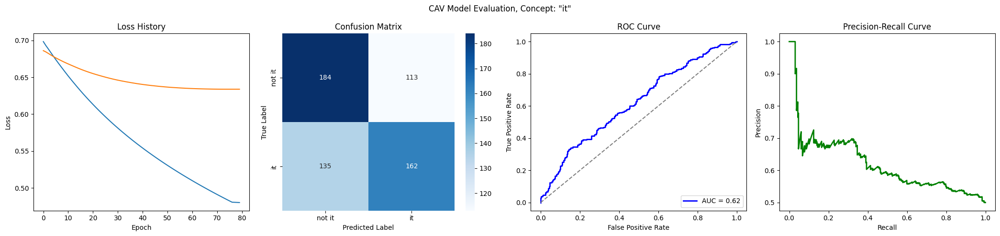

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6738
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6573
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5901
Epoch 31 Validation Loss: 0.6449
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5640
Epoch 41 Validation Loss: 0.6361
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5414
Epoch 51 Validation Loss: 0.6298
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5215
Epoch 61 Validation Loss: 0.6252
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5038
Epoch 71 Validation Loss: 0.6219
Model saved to train

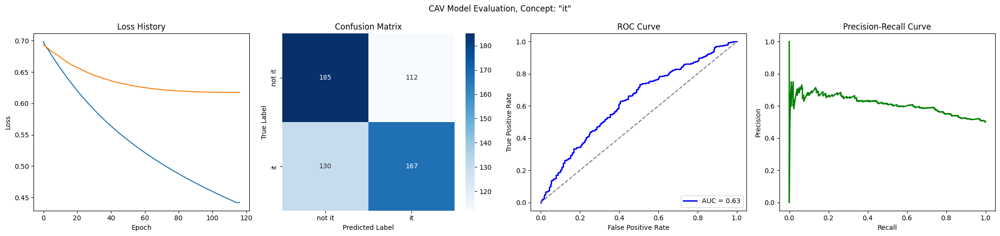

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6580
Epoch 11 Validation Loss: 0.6677
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6279
Epoch 21 Validation Loss: 0.6507
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6017
Epoch 31 Validation Loss: 0.6382
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5785
Epoch 41 Validation Loss: 0.6293
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5577
Epoch 51 Validation Loss: 0.6233
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5390
Epoch 61 Validation Loss: 0.6192
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5218
Epoch 71 Validation Loss: 0.6166
Model saved to train

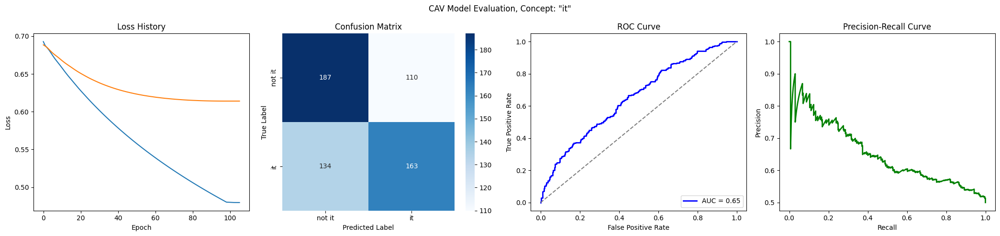

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6593
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6277
Epoch 21 Validation Loss: 0.6723
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6002
Epoch 31 Validation Loss: 0.6659
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5762
Epoch 41 Validation Loss: 0.6613
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5549
Epoch 51 Validation Loss: 0.6584
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5357
Epoch 61 Validation Loss: 0.6569
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5183
Epoch 71 Validation Loss: 0.6563
Model saved to train

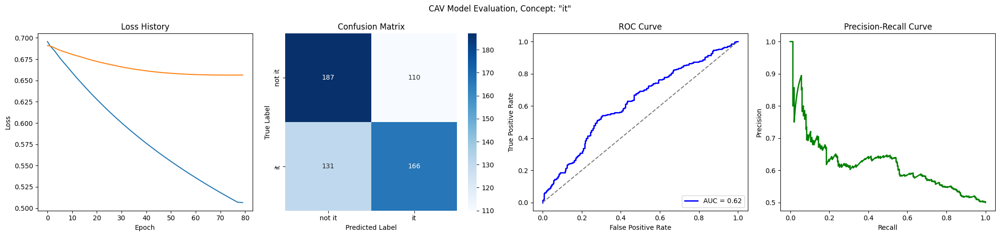

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6718
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6118
Epoch 21 Validation Loss: 0.6562
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5782
Epoch 31 Validation Loss: 0.6435
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5500
Epoch 41 Validation Loss: 0.6335
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5259
Epoch 51 Validation Loss: 0.6256
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5050
Epoch 61 Validation Loss: 0.6193
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4864
Epoch 71 Validation Loss: 0.6144
Model saved to train

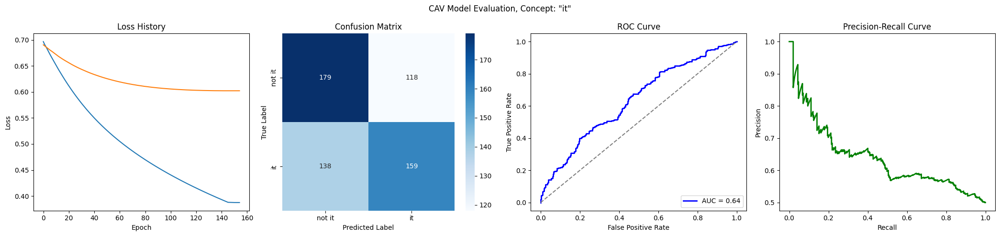

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6539
Epoch 11 Validation Loss: 0.6712
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6157
Epoch 21 Validation Loss: 0.6549
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5839
Epoch 31 Validation Loss: 0.6425
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5569
Epoch 41 Validation Loss: 0.6327
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5336
Epoch 51 Validation Loss: 0.6256
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5131
Epoch 61 Validation Loss: 0.6206
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4948
Epoch 71 Validation Loss: 0.6176
Model saved to train

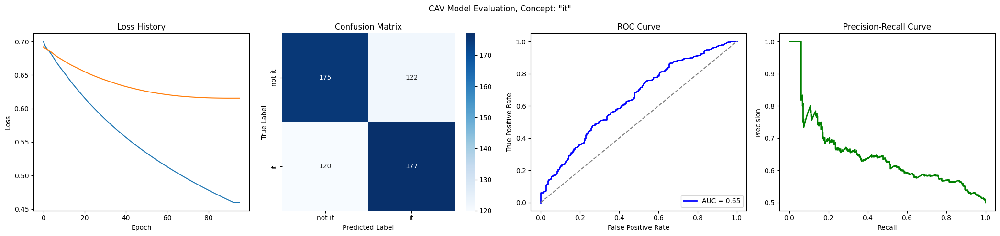

Training run 10/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6711
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6260
Epoch 21 Validation Loss: 0.6534
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6398
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5706
Epoch 41 Validation Loss: 0.6302
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5476
Epoch 51 Validation Loss: 0.6236
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5271
Epoch 61 Validation Loss: 0.6191
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5086
Epoch 71 Validation Loss: 0.6162
Model saved to trai

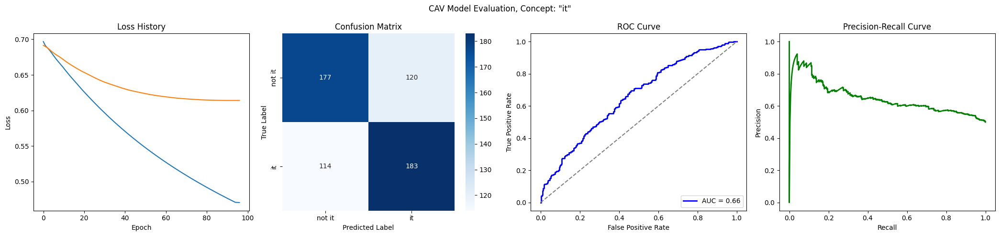

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6531
Epoch 11 Validation Loss: 0.6758
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6177
Epoch 21 Validation Loss: 0.6608
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5878
Epoch 31 Validation Loss: 0.6490
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5616
Epoch 41 Validation Loss: 0.6397
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5384
Epoch 51 Validation Loss: 0.6331
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5175
Epoch 61 Validation Loss: 0.6288
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4985
Epoch 71 Validation Loss: 0.6263
Model saved to trai

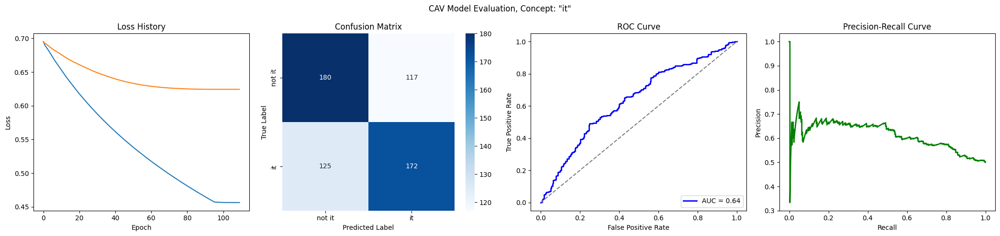

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6467
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6074
Epoch 21 Validation Loss: 0.6583
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5759
Epoch 31 Validation Loss: 0.6450
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5499
Epoch 41 Validation Loss: 0.6351
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5278
Epoch 51 Validation Loss: 0.6278
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5083
Epoch 61 Validation Loss: 0.6225
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4909
Epoch 71 Validation Loss: 0.6185
Model saved to trai

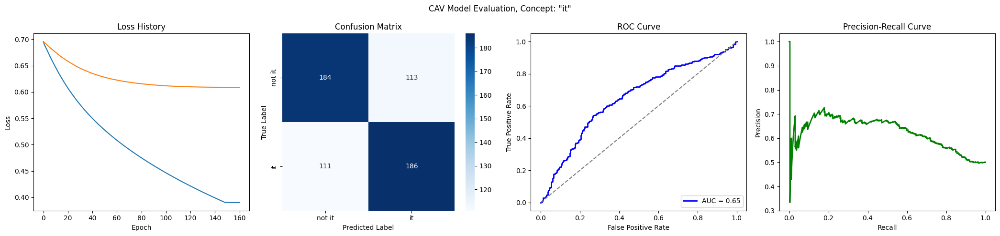

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6578
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6260
Epoch 21 Validation Loss: 0.6673
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5980
Epoch 31 Validation Loss: 0.6607
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5731
Epoch 41 Validation Loss: 0.6568
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5507
Epoch 51 Validation Loss: 0.6547
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5306
Epoch 61 Validation Loss: 0.6537
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5121
Epoch 71 Validation Loss: 0.6536
Early stopping at e

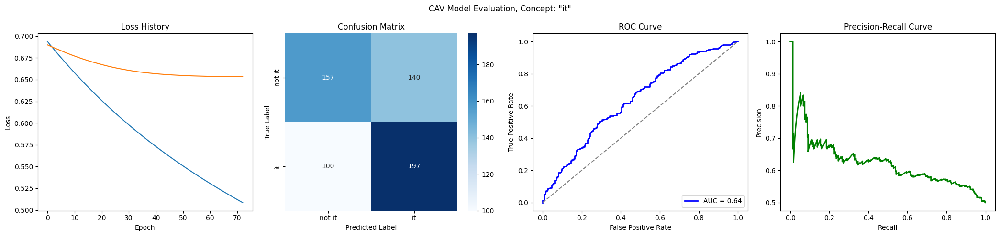

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6646
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6183
Epoch 21 Validation Loss: 0.6438
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5875
Epoch 31 Validation Loss: 0.6269
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5605
Epoch 41 Validation Loss: 0.6137
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5366
Epoch 51 Validation Loss: 0.6036
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5151
Epoch 61 Validation Loss: 0.5960
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4957
Epoch 71 Validation Loss: 0.5904
Model saved to trai

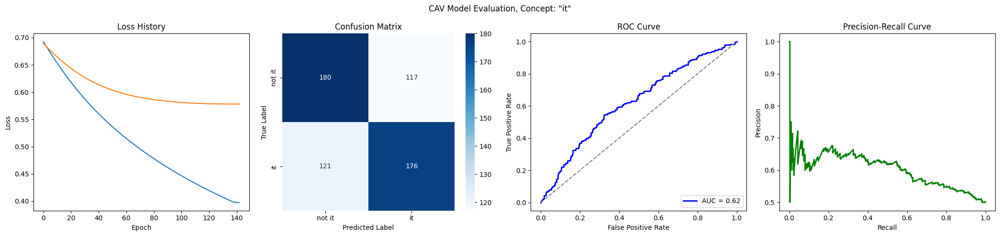

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6588
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6061
Epoch 21 Validation Loss: 0.6357
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5757
Epoch 31 Validation Loss: 0.6174
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5499
Epoch 41 Validation Loss: 0.6034
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5275
Epoch 51 Validation Loss: 0.5931
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5076
Epoch 61 Validation Loss: 0.5855
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4895
Epoch 71 Validation Loss: 0.5799
Model saved to trai

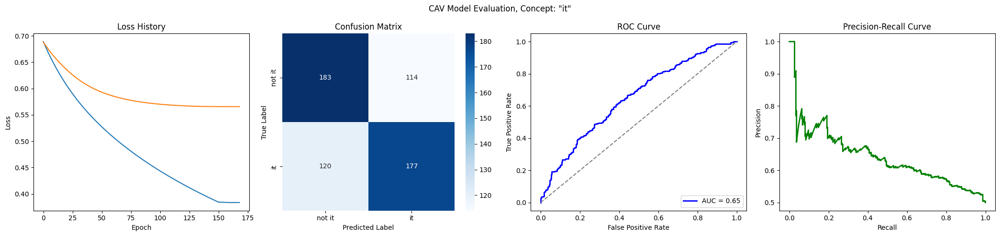

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6605
Epoch 11 Validation Loss: 0.6698
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6261
Epoch 21 Validation Loss: 0.6522
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5957
Epoch 31 Validation Loss: 0.6384
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5690
Epoch 41 Validation Loss: 0.6275
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5454
Epoch 51 Validation Loss: 0.6188
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5245
Epoch 61 Validation Loss: 0.6117
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5058
Epoch 71 Validation Loss: 0.6060
Model saved to trai

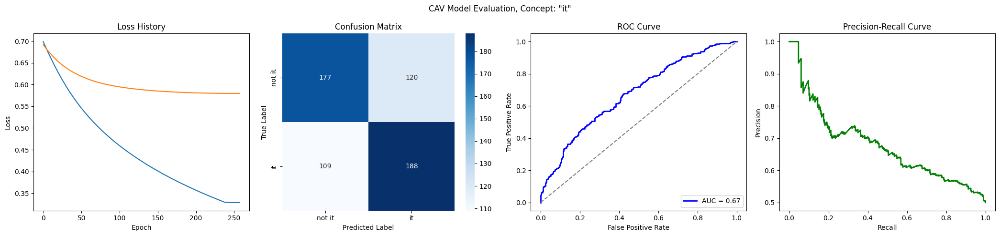

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6770
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6231
Epoch 21 Validation Loss: 0.6653
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6576
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5714
Epoch 41 Validation Loss: 0.6531
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5507
Epoch 51 Validation Loss: 0.6507
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5322
Epoch 61 Validation Loss: 0.6497
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5198
Epoch 71 Validation Loss: 0.6496
Early stopping at e

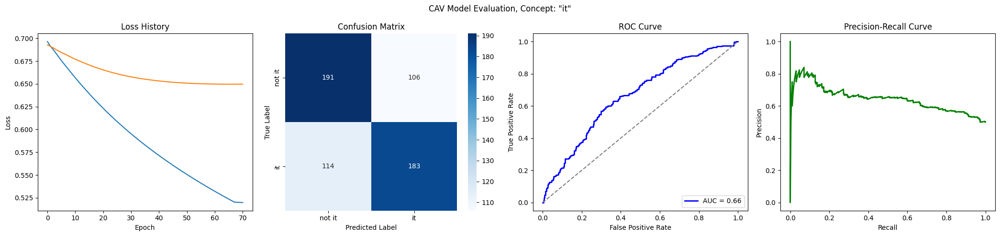

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6555
Epoch 11 Validation Loss: 0.6819
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6227
Epoch 21 Validation Loss: 0.6739
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5949
Epoch 31 Validation Loss: 0.6679
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5708
Epoch 41 Validation Loss: 0.6643
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5494
Epoch 51 Validation Loss: 0.6628
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/language_it/loss_history.json


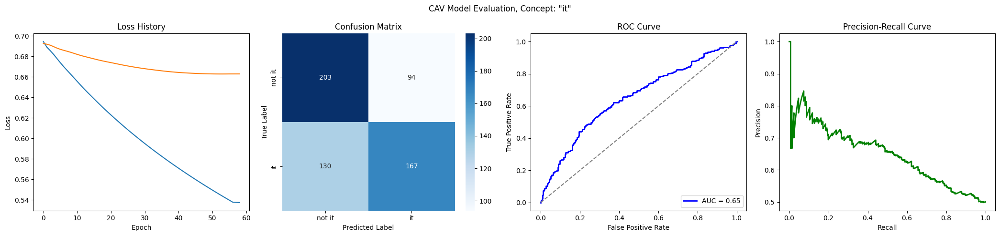

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6529
Epoch 11 Validation Loss: 0.6650
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6180
Epoch 21 Validation Loss: 0.6454
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5888
Epoch 31 Validation Loss: 0.6317
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5637
Epoch 41 Validation Loss: 0.6223
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5419
Epoch 51 Validation Loss: 0.6157
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5225
Epoch 61 Validation Loss: 0.6110
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5050
Epoch 71 Validation Loss: 0.6076
Model saved to trai

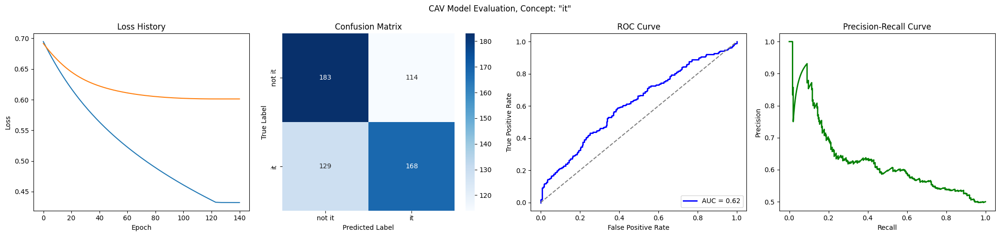

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6578
Epoch 11 Validation Loss: 0.6660
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6232
Epoch 21 Validation Loss: 0.6447
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5926
Epoch 31 Validation Loss: 0.6289
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5655
Epoch 41 Validation Loss: 0.6170
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5411
Epoch 51 Validation Loss: 0.6079
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5191
Epoch 61 Validation Loss: 0.6008
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4989
Epoch 71 Validation Loss: 0.5953
Model saved to trai

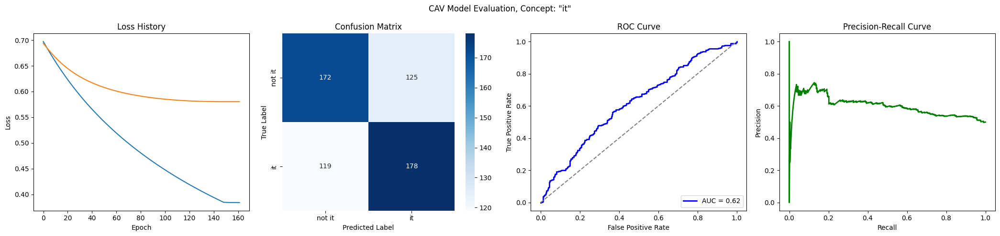

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6572
Epoch 11 Validation Loss: 0.6722
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6232
Epoch 21 Validation Loss: 0.6547
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5933
Epoch 31 Validation Loss: 0.6409
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5671
Epoch 41 Validation Loss: 0.6300
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5439
Epoch 51 Validation Loss: 0.6213
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5232
Epoch 61 Validation Loss: 0.6142
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5044
Epoch 71 Validation Loss: 0.6084
Model saved to trai

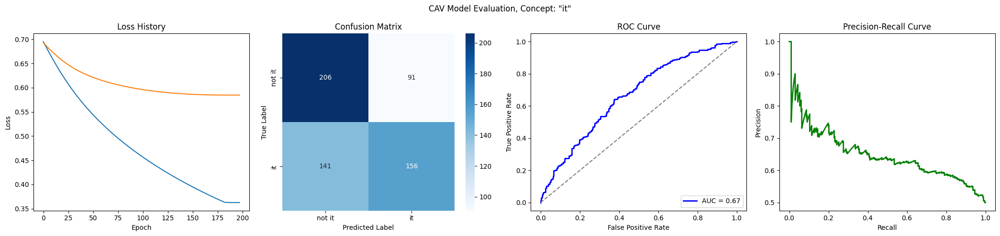

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6492
Epoch 11 Validation Loss: 0.6725
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6101
Epoch 21 Validation Loss: 0.6565
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5769
Epoch 31 Validation Loss: 0.6454
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5487
Epoch 41 Validation Loss: 0.6382
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5245
Epoch 51 Validation Loss: 0.6338
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5034
Epoch 61 Validation Loss: 0.6315
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4846
Epoch 71 Validation Loss: 0.6307
Model saved to trai

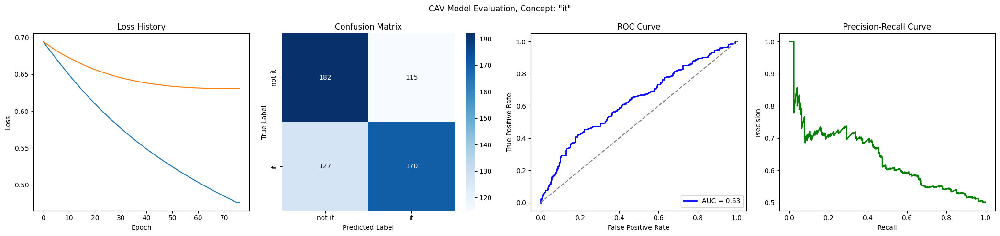

Training run 23/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6802
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6137
Epoch 21 Validation Loss: 0.6670
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5815
Epoch 31 Validation Loss: 0.6570
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5539
Epoch 41 Validation Loss: 0.6493
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5300
Epoch 51 Validation Loss: 0.6436
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5087
Epoch 61 Validation Loss: 0.6397
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4897
Epoch 71 Validation Loss: 0.6373
Model saved to trai

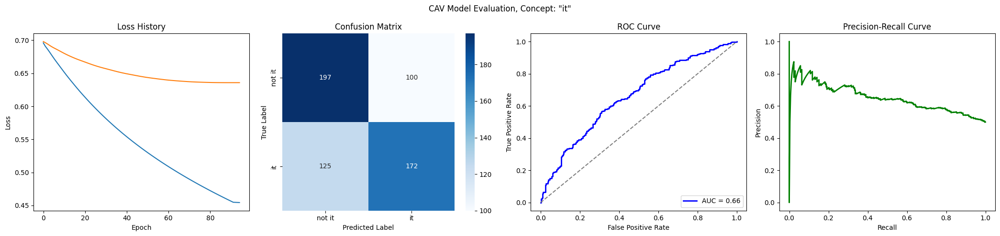

Training run 24/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6740
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6087
Epoch 21 Validation Loss: 0.6609
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5742
Epoch 31 Validation Loss: 0.6520
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5446
Epoch 41 Validation Loss: 0.6461
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5191
Epoch 51 Validation Loss: 0.6424
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4968
Epoch 61 Validation Loss: 0.6401
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4771
Epoch 71 Validation Loss: 0.6388
Model saved to trai

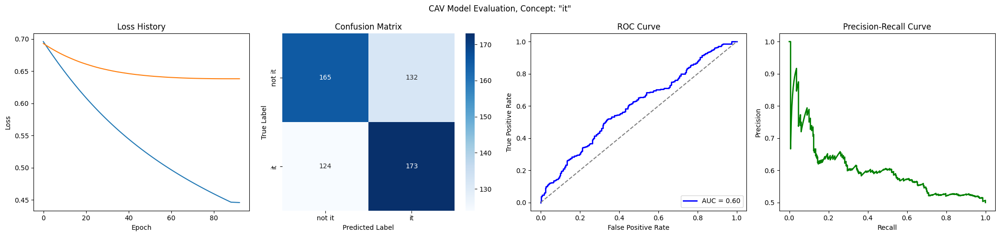

Training run 25/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_it/state_dict.pth
Epoch 111/500
Epoch 111 Train Loss: 0.4584
Epoch 111 Validation Loss: 0.6255
Early stopping at epoch 112
Loss history saved to trainings/language_it/loss_history.json


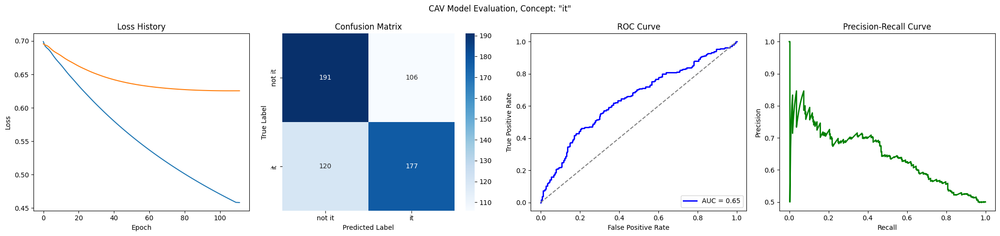

Training run 27/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6542
Epoch 11 Validation Loss: 0.6686
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6177
Epoch 21 Validation Loss: 0.6485
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5864
Epoch 31 Validation Loss: 0.6332
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5591
Epoch 41 Validation Loss: 0.6218
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5351
Epoch 51 Validation Loss: 0.6136
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5136
Epoch 61 Validation Loss: 0.6077
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4943
Epoch 71 Validation Loss: 0.6034
Model saved to trai

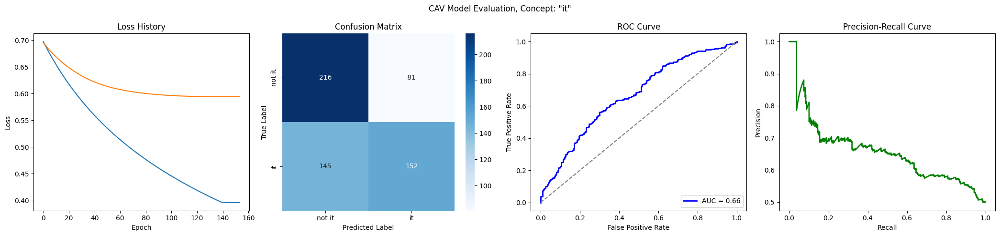

Training run 28/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6974
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6550
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6194
Epoch 21 Validation Loss: 0.6645
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5888
Epoch 31 Validation Loss: 0.6557
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5626
Epoch 41 Validation Loss: 0.6505
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5398
Epoch 51 Validation Loss: 0.6484
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/language_it/loss_history.json


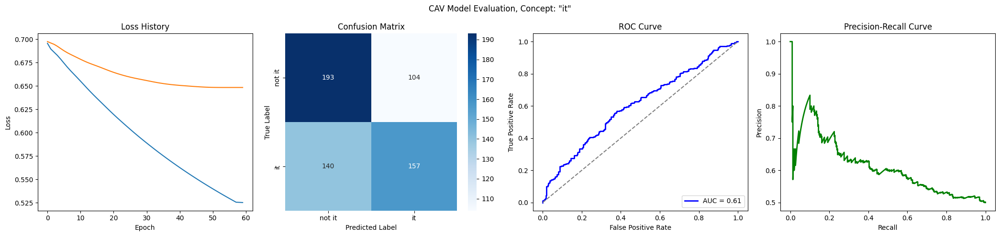

Training run 29/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6602
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6265
Epoch 21 Validation Loss: 0.6594
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6478
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5707
Epoch 41 Validation Loss: 0.6391
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5478
Epoch 51 Validation Loss: 0.6321
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5273
Epoch 61 Validation Loss: 0.6273
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5088
Epoch 71 Validation Loss: 0.6239
Model saved to trai

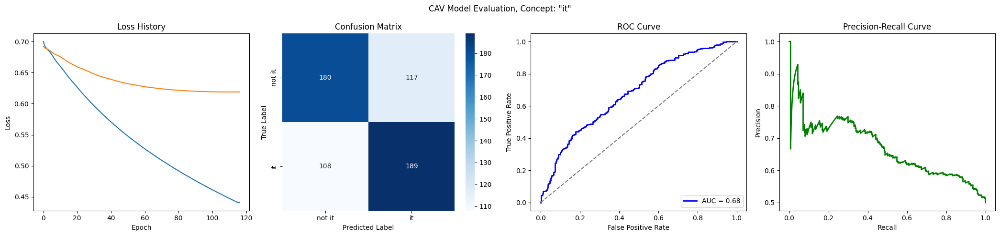

Training run 30/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6902
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6804
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6175
Epoch 21 Validation Loss: 0.6696
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5897
Epoch 31 Validation Loss: 0.6598
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5655
Epoch 41 Validation Loss: 0.6527
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5440
Epoch 51 Validation Loss: 0.6481
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5247
Epoch 61 Validation Loss: 0.6450
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5072
Epoch 71 Validation Loss: 0.6427
Model saved to trai

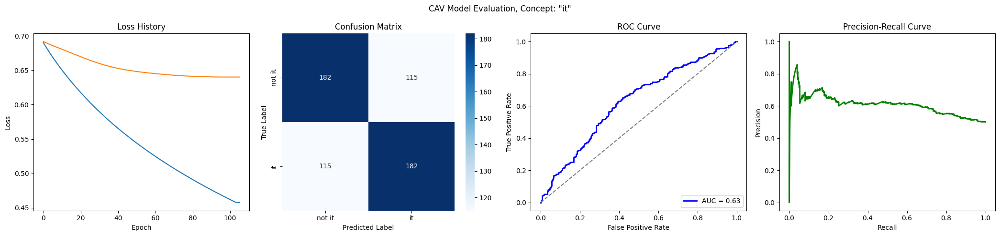

Training run 31/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6467
Epoch 11 Validation Loss: 0.6731
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6111
Epoch 21 Validation Loss: 0.6636
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5813
Epoch 31 Validation Loss: 0.6572
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5556
Epoch 41 Validation Loss: 0.6532
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5330
Epoch 51 Validation Loss: 0.6516
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/language_it/loss_history.json


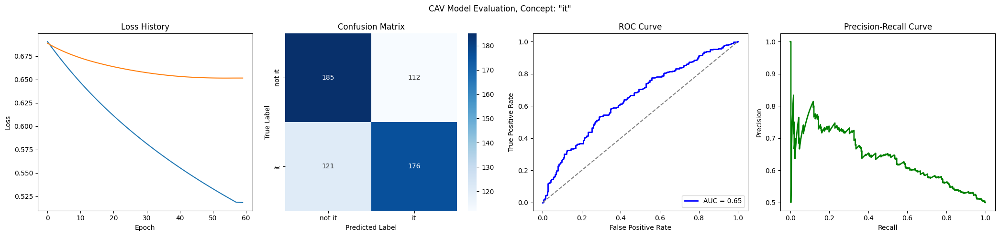

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6801
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6276
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6004
Epoch 31 Validation Loss: 0.6610
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5770
Epoch 41 Validation Loss: 0.6541
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5564
Epoch 51 Validation Loss: 0.6486
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5379
Epoch 61 Validation Loss: 0.6441
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5212
Epoch 71 Validation Loss: 0.6407
Model saved to trai

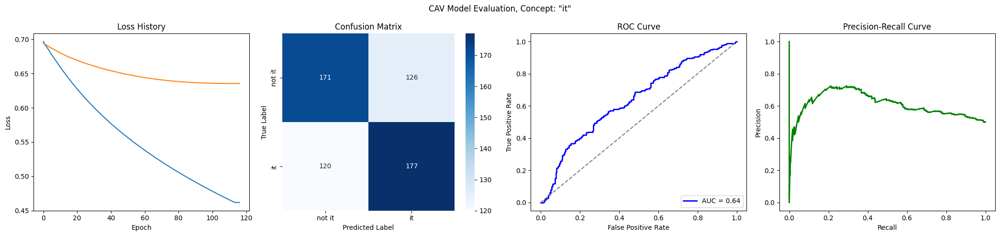

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6574
Epoch 11 Validation Loss: 0.6747
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6248
Epoch 21 Validation Loss: 0.6629
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5964
Epoch 31 Validation Loss: 0.6540
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5713
Epoch 41 Validation Loss: 0.6464
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5488
Epoch 51 Validation Loss: 0.6400
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5283
Epoch 61 Validation Loss: 0.6348
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5096
Epoch 71 Validation Loss: 0.6307
Model saved to trai

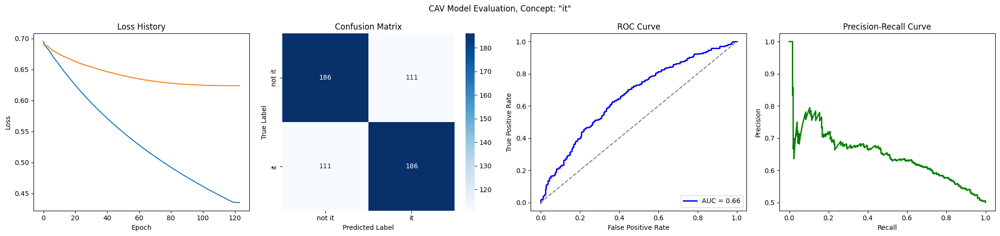

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6600
Epoch 11 Validation Loss: 0.6666
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6311
Epoch 21 Validation Loss: 0.6470
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6063
Epoch 31 Validation Loss: 0.6323
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5848
Epoch 41 Validation Loss: 0.6217
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5659
Epoch 51 Validation Loss: 0.6142
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5488
Epoch 61 Validation Loss: 0.6088
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5331
Epoch 71 Validation Loss: 0.6049
Model saved to trai

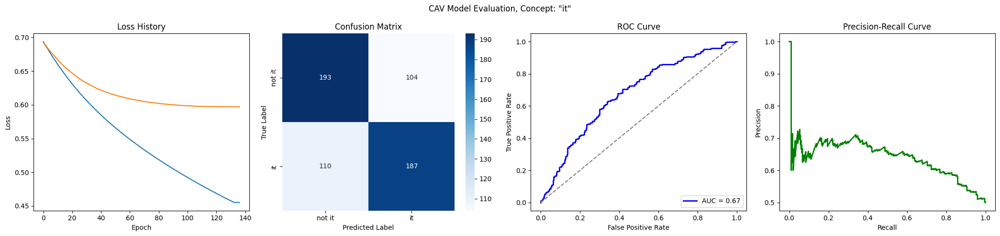

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6666
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6125
Epoch 21 Validation Loss: 0.6498
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5816
Epoch 31 Validation Loss: 0.6377
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5549
Epoch 41 Validation Loss: 0.6292
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5314
Epoch 51 Validation Loss: 0.6236
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5104
Epoch 61 Validation Loss: 0.6199
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4914
Epoch 71 Validation Loss: 0.6177
Model saved to trai

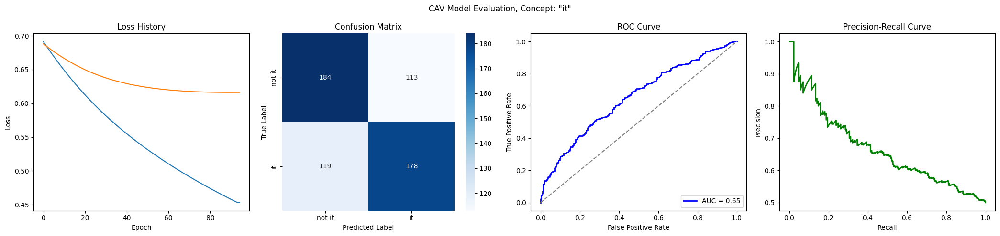

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6537
Epoch 11 Validation Loss: 0.6727
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6156
Epoch 21 Validation Loss: 0.6571
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5829
Epoch 31 Validation Loss: 0.6467
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5548
Epoch 41 Validation Loss: 0.6406
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5304
Epoch 51 Validation Loss: 0.6379
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5090
Epoch 61 Validation Loss: 0.6375
Early stopping at epoch 62
Loss history saved to trainings/language_it/loss_history.json


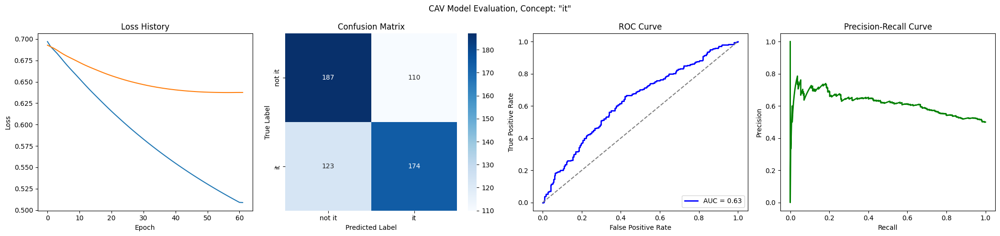

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6621
Epoch 11 Validation Loss: 0.6757
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6323
Epoch 21 Validation Loss: 0.6625
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6059
Epoch 31 Validation Loss: 0.6524
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5822
Epoch 41 Validation Loss: 0.6448
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5611
Epoch 51 Validation Loss: 0.6392
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5419
Epoch 61 Validation Loss: 0.6354
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5244
Epoch 71 Validation Loss: 0.6328
Model saved to trai

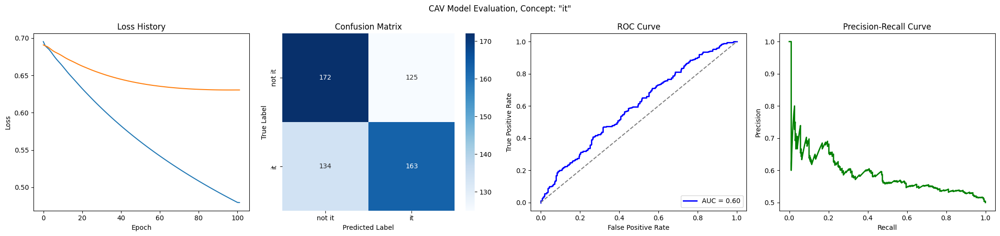

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6571
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6234
Epoch 21 Validation Loss: 0.6591
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5953
Epoch 31 Validation Loss: 0.6476
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5712
Epoch 41 Validation Loss: 0.6397
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5500
Epoch 51 Validation Loss: 0.6346
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5310
Epoch 61 Validation Loss: 0.6316
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5137
Epoch 71 Validation Loss: 0.6301
Model saved to trai

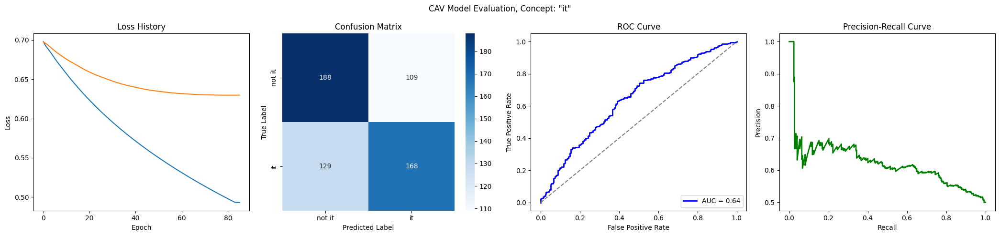

Training run 39/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6572
Epoch 11 Validation Loss: 0.6751
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6255
Epoch 21 Validation Loss: 0.6596
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5977
Epoch 31 Validation Loss: 0.6483
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5733
Epoch 41 Validation Loss: 0.6408
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5515
Epoch 51 Validation Loss: 0.6358
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5316
Epoch 61 Validation Loss: 0.6327
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5134
Epoch 71 Validation Loss: 0.6308
Model saved to trai

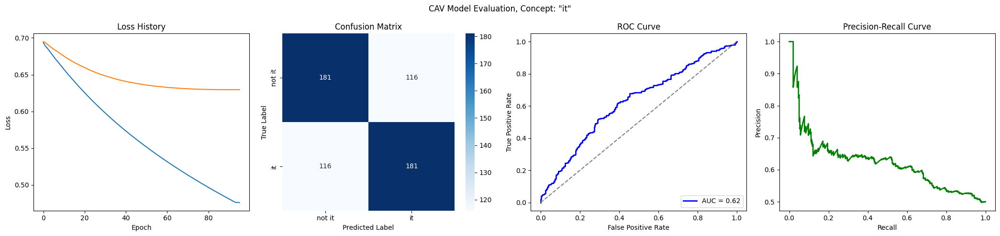

Training run 40/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7020
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6583
Epoch 11 Validation Loss: 0.6801
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6235
Epoch 21 Validation Loss: 0.6686
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5935
Epoch 31 Validation Loss: 0.6615
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5676
Epoch 41 Validation Loss: 0.6569
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5448
Epoch 51 Validation Loss: 0.6541
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5244
Epoch 61 Validation Loss: 0.6534
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_it/loss_history.json


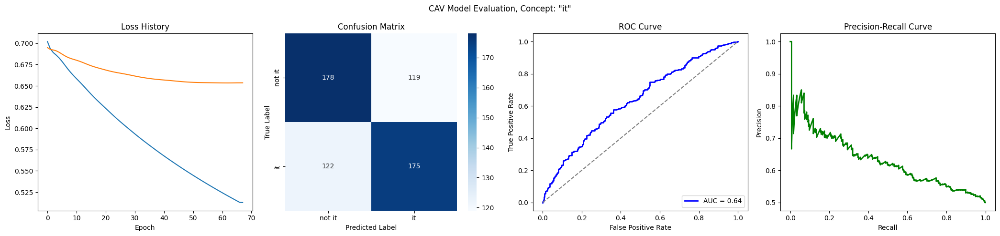

Training run 41/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6988
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6583
Epoch 11 Validation Loss: 0.6746
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6226
Epoch 21 Validation Loss: 0.6602
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5918
Epoch 31 Validation Loss: 0.6498
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5649
Epoch 41 Validation Loss: 0.6427
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5411
Epoch 51 Validation Loss: 0.6380
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5199
Epoch 61 Validation Loss: 0.6348
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5007
Epoch 71 Validation Loss: 0.6329
Model saved to trai

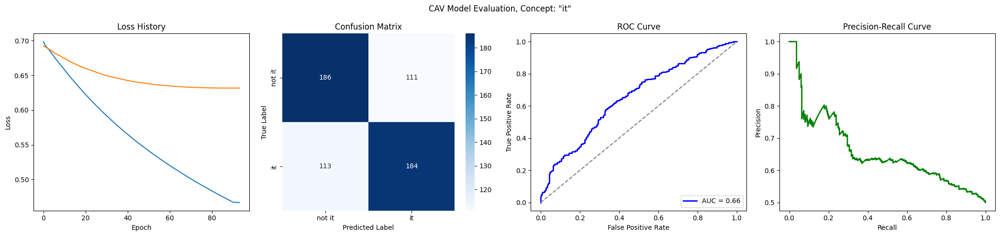

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6568
Epoch 11 Validation Loss: 0.6738
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6248
Epoch 21 Validation Loss: 0.6596
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5976
Epoch 31 Validation Loss: 0.6499
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5740
Epoch 41 Validation Loss: 0.6434
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5533
Epoch 51 Validation Loss: 0.6394
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5348
Epoch 61 Validation Loss: 0.6375
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5181
Epoch 71 Validation Loss: 0.6372
Early stopping at e

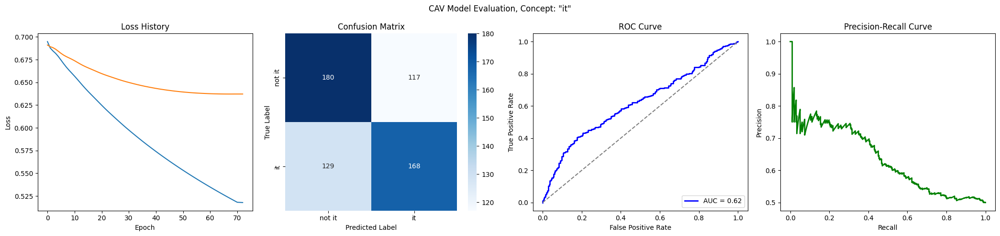

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6107
Epoch 21 Validation Loss: 0.6738
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5793
Epoch 31 Validation Loss: 0.6680
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5522
Epoch 41 Validation Loss: 0.6638
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5284
Epoch 51 Validation Loss: 0.6617
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5073
Epoch 61 Validation Loss: 0.6611
Early stopping at epoch 65
Loss history saved to trainings/language_it/loss_history.json


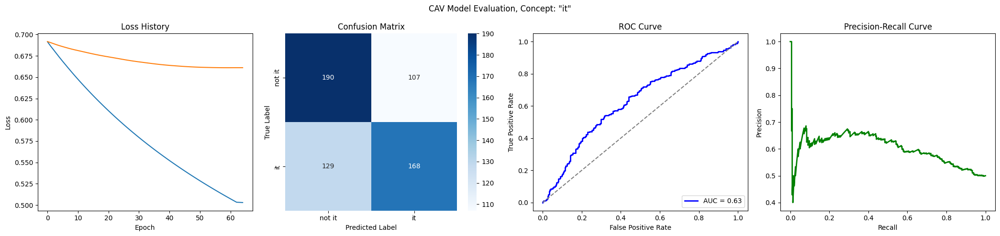

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6727
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6185
Epoch 21 Validation Loss: 0.6532
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5892
Epoch 31 Validation Loss: 0.6375
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5643
Epoch 41 Validation Loss: 0.6247
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5425
Epoch 51 Validation Loss: 0.6142
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5230
Epoch 61 Validation Loss: 0.6056
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5053
Epoch 71 Validation Loss: 0.5989
Model saved to trai

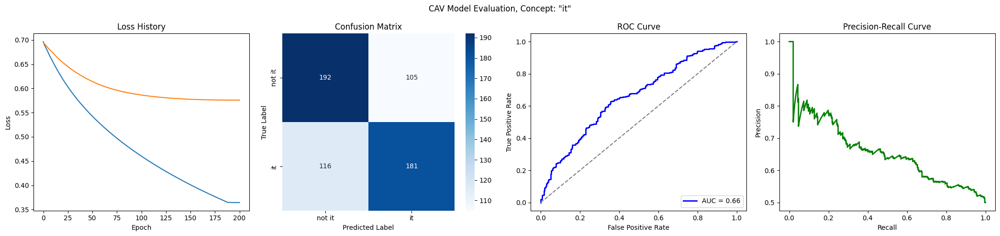

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6733
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6605
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5889
Epoch 31 Validation Loss: 0.6510
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5612
Epoch 41 Validation Loss: 0.6446
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5366
Epoch 51 Validation Loss: 0.6409
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5146
Epoch 61 Validation Loss: 0.6390
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4947
Epoch 71 Validation Loss: 0.6383
Model saved to trai

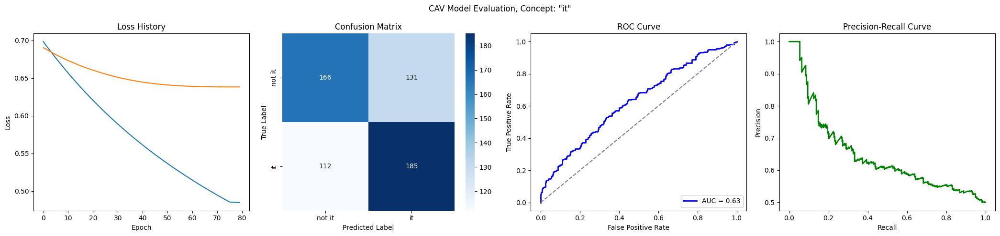

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6597
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6275
Epoch 21 Validation Loss: 0.6664
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5992
Epoch 31 Validation Loss: 0.6580
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5743
Epoch 41 Validation Loss: 0.6523
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5520
Epoch 51 Validation Loss: 0.6488
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5319
Epoch 61 Validation Loss: 0.6467
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5135
Epoch 71 Validation Loss: 0.6457
Model saved to trai

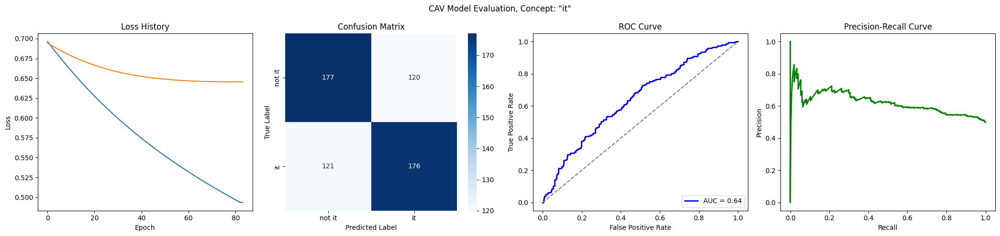

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7028
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6596
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6229
Epoch 21 Validation Loss: 0.6792
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5916
Epoch 31 Validation Loss: 0.6753
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5650
Epoch 41 Validation Loss: 0.6727
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5420
Epoch 51 Validation Loss: 0.6718
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/language_it/loss_history.json


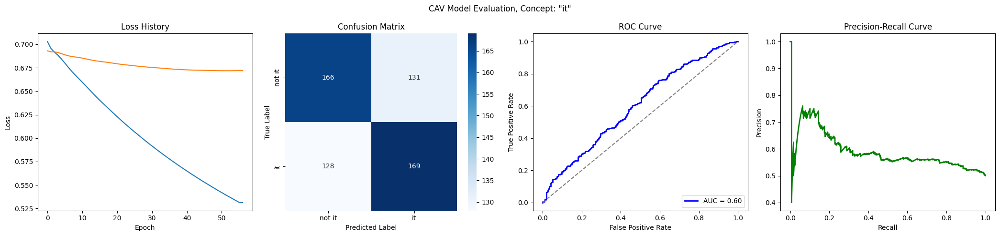

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6458
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6067
Epoch 21 Validation Loss: 0.6701
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5754
Epoch 31 Validation Loss: 0.6652
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5496
Epoch 41 Validation Loss: 0.6621
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5278
Epoch 51 Validation Loss: 0.6604
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5090
Epoch 61 Validation Loss: 0.6598
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_it/loss_history.json


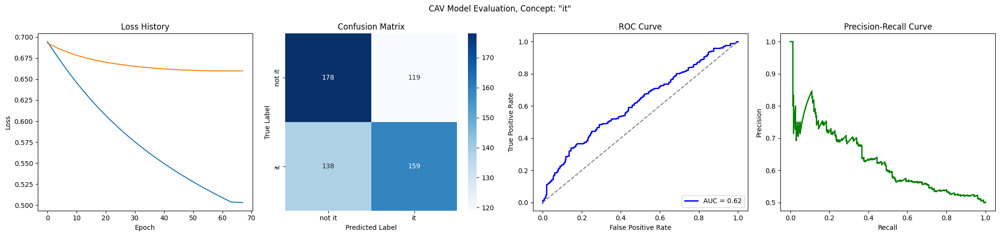

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6632
Epoch 11 Validation Loss: 0.6805
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6320
Epoch 21 Validation Loss: 0.6669
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6041
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5790
Epoch 41 Validation Loss: 0.6463
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5564
Epoch 51 Validation Loss: 0.6393
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5358
Epoch 61 Validation Loss: 0.6343
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5169
Epoch 71 Validation Loss: 0.6310
Model saved to trai

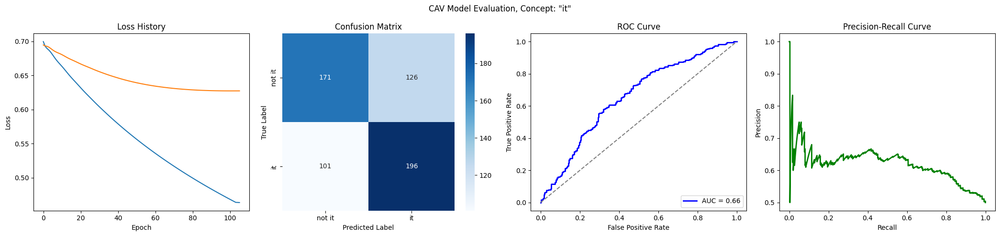

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6546
Epoch 11 Validation Loss: 0.6766
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6199
Epoch 21 Validation Loss: 0.6665
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5909
Epoch 31 Validation Loss: 0.6606
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5662
Epoch 41 Validation Loss: 0.6574
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5447
Epoch 51 Validation Loss: 0.6559
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5255
Epoch 61 Validation Loss: 0.6555
Early stopping at epoch 64
Loss history saved to trainings/language_it/loss_history.json


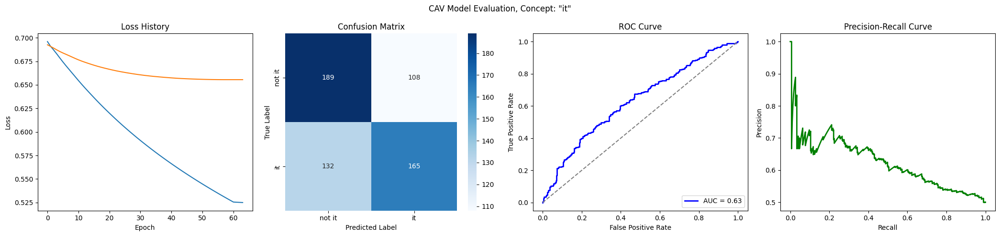

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6468
Epoch 11 Validation Loss: 0.6676
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6059
Epoch 21 Validation Loss: 0.6505
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5713
Epoch 31 Validation Loss: 0.6379
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5417
Epoch 41 Validation Loss: 0.6287
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5159
Epoch 51 Validation Loss: 0.6222
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4930
Epoch 61 Validation Loss: 0.6180
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4725
Epoch 71 Validation Loss: 0.6157
Model saved to trai

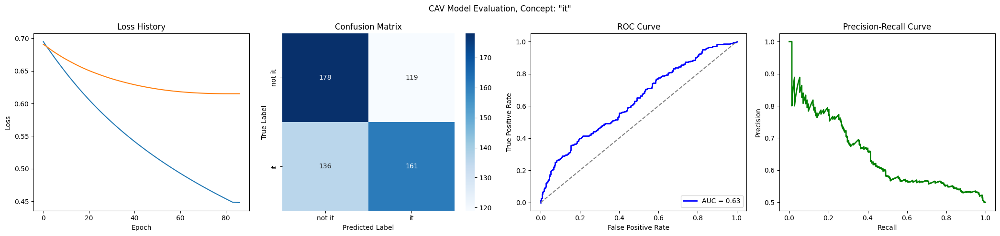

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6510
Epoch 11 Validation Loss: 0.6696
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6169
Epoch 21 Validation Loss: 0.6538
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5884
Epoch 31 Validation Loss: 0.6408
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5640
Epoch 41 Validation Loss: 0.6305
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5427
Epoch 51 Validation Loss: 0.6229
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5238
Epoch 61 Validation Loss: 0.6173
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5066
Epoch 71 Validation Loss: 0.6131
Model saved to trai

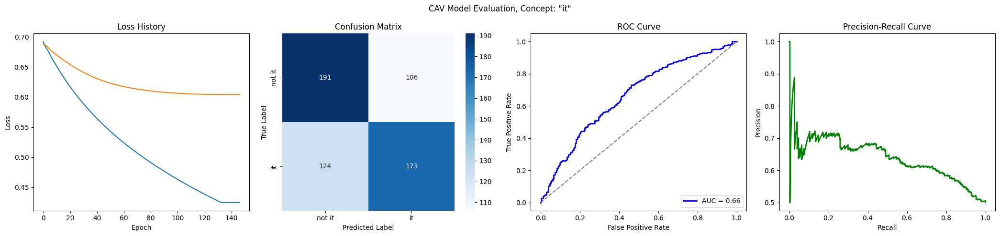

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6515
Epoch 11 Validation Loss: 0.6845
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6151
Epoch 21 Validation Loss: 0.6803
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/language_it/loss_history.json


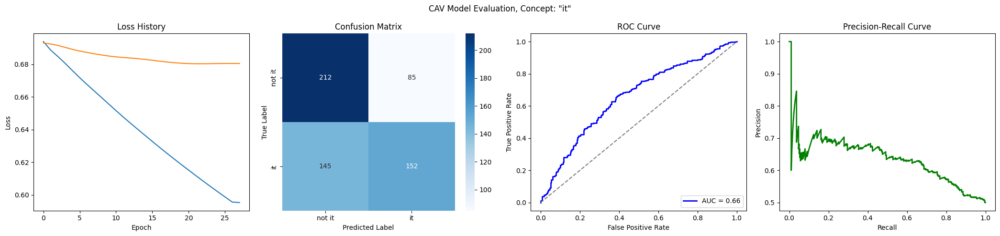

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6624
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6335
Epoch 21 Validation Loss: 0.6741
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6083
Epoch 31 Validation Loss: 0.6694
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5861
Epoch 41 Validation Loss: 0.6666
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5660
Epoch 51 Validation Loss: 0.6651
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5476
Epoch 61 Validation Loss: 0.6644
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5400
Epoch 71 Validation Loss: 0.6644
Early stopping at e

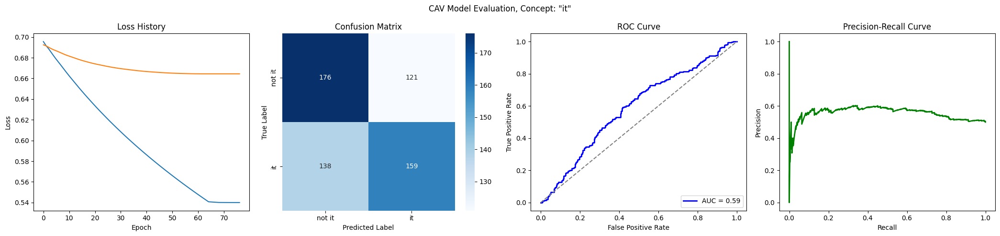

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6874
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6593
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6274
Epoch 21 Validation Loss: 0.6600
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5996
Epoch 31 Validation Loss: 0.6496
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5751
Epoch 41 Validation Loss: 0.6419
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5535
Epoch 51 Validation Loss: 0.6363
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5342
Epoch 61 Validation Loss: 0.6324
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5166
Epoch 71 Validation Loss: 0.6297
Model saved to trai

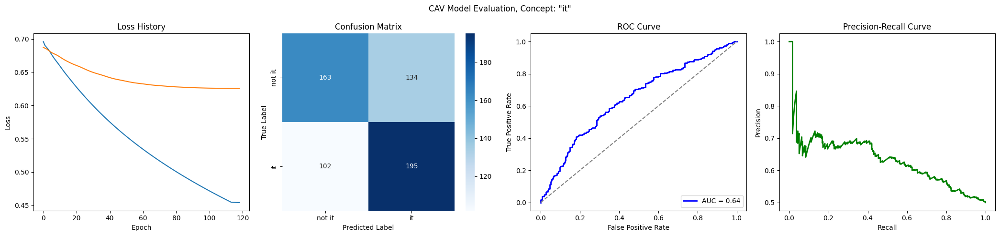

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6472
Epoch 11 Validation Loss: 0.6725
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6083
Epoch 21 Validation Loss: 0.6546
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5759
Epoch 31 Validation Loss: 0.6397
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5484
Epoch 41 Validation Loss: 0.6279
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5247
Epoch 51 Validation Loss: 0.6193
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5037
Epoch 61 Validation Loss: 0.6132
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4850
Epoch 71 Validation Loss: 0.6091
Model saved to trai

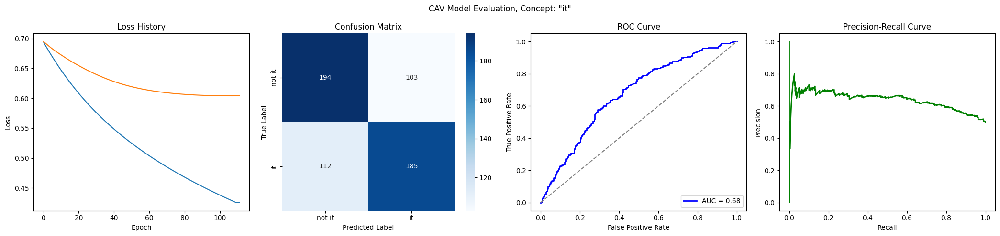

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6896
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6418
Epoch 11 Validation Loss: 0.6715
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6032
Epoch 21 Validation Loss: 0.6603
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5719
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5455
Epoch 41 Validation Loss: 0.6456
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5228
Epoch 51 Validation Loss: 0.6403
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5028
Epoch 61 Validation Loss: 0.6365
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4848
Epoch 71 Validation Loss: 0.6338
Model saved to trai

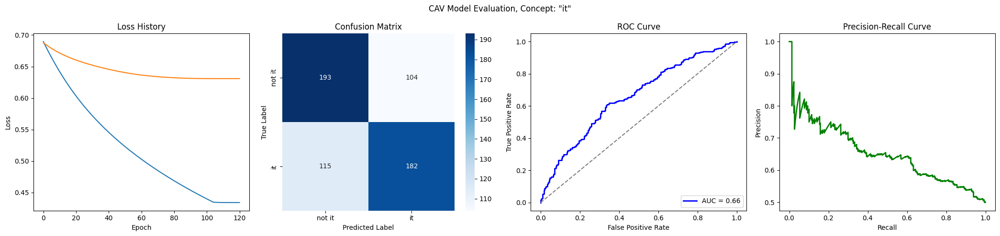

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6587
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6239
Epoch 21 Validation Loss: 0.6675
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5937
Epoch 31 Validation Loss: 0.6604
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5676
Epoch 41 Validation Loss: 0.6563
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5447
Epoch 51 Validation Loss: 0.6545
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5263
Epoch 61 Validation Loss: 0.6542
Early stopping at epoch 62
Loss history saved to trainings/language_it/loss_history.json


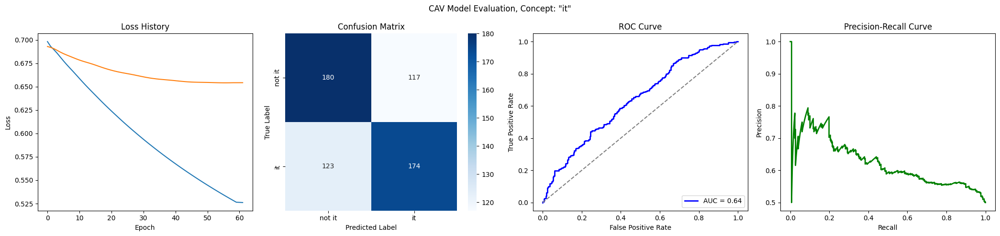

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6537
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6189
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5893
Epoch 31 Validation Loss: 0.6583
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5639
Epoch 41 Validation Loss: 0.6555
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5415
Epoch 51 Validation Loss: 0.6551
Early stopping at epoch 53
Loss history saved to trainings/language_it/loss_history.json


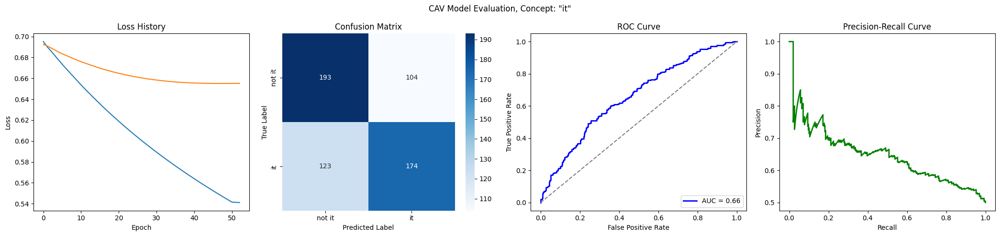

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6581
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6269
Epoch 21 Validation Loss: 0.6618
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6001
Epoch 31 Validation Loss: 0.6516
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5766
Epoch 41 Validation Loss: 0.6430
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5556
Epoch 51 Validation Loss: 0.6355
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5367
Epoch 61 Validation Loss: 0.6295
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5195
Epoch 71 Validation Loss: 0.6247
Model saved to trai

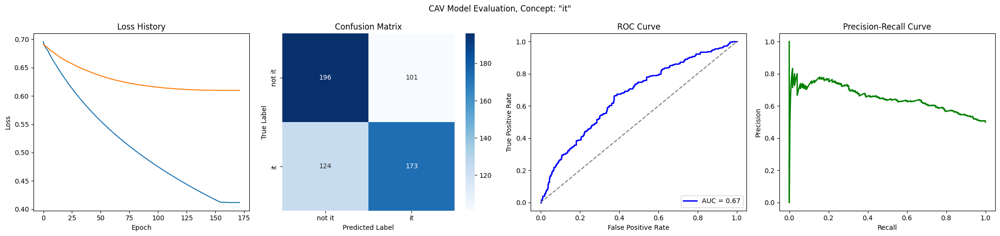

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6964
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6570
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6224
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5924
Epoch 31 Validation Loss: 0.6511
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5661
Epoch 41 Validation Loss: 0.6438
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5430
Epoch 51 Validation Loss: 0.6395
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5224
Epoch 61 Validation Loss: 0.6377
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5088
Epoch 71 Validation Loss: 0.6376
Early stopping at e

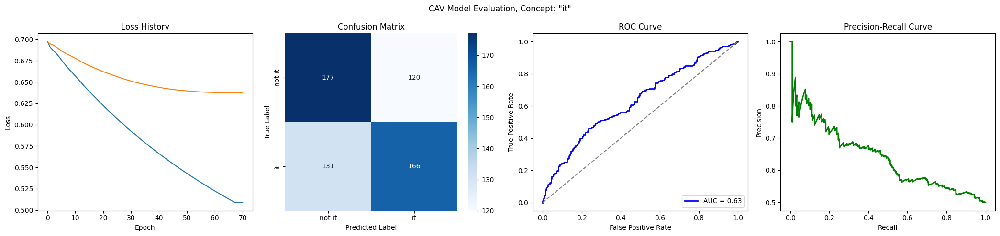

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6631
Epoch 11 Validation Loss: 0.6879
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6333
Epoch 21 Validation Loss: 0.6825
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6083
Epoch 31 Validation Loss: 0.6795
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5871
Epoch 41 Validation Loss: 0.6784
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5687
Epoch 51 Validation Loss: 0.6775
Early stopping at epoch 54
Loss history saved to trainings/language_it/loss_history.json


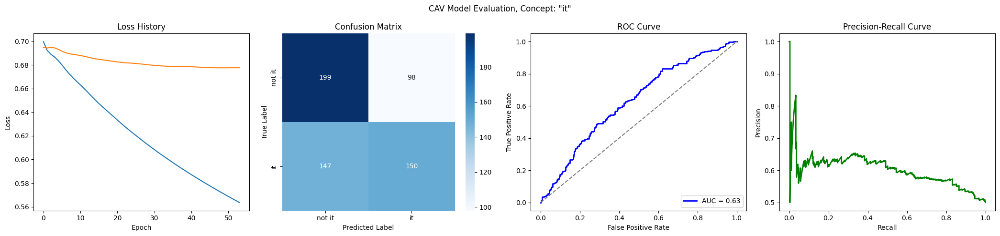

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6729
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6127
Epoch 21 Validation Loss: 0.6600
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5828
Epoch 31 Validation Loss: 0.6520
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5573
Epoch 41 Validation Loss: 0.6478
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5349
Epoch 51 Validation Loss: 0.6464
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/language_it/loss_history.json


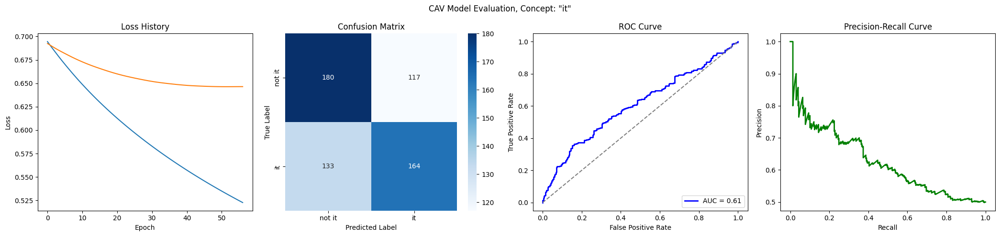

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6584
Epoch 11 Validation Loss: 0.6779
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6262
Epoch 21 Validation Loss: 0.6691
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5981
Epoch 31 Validation Loss: 0.6638
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5731
Epoch 41 Validation Loss: 0.6618
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 48
Loss history saved to trainings/language_it/loss_history.json


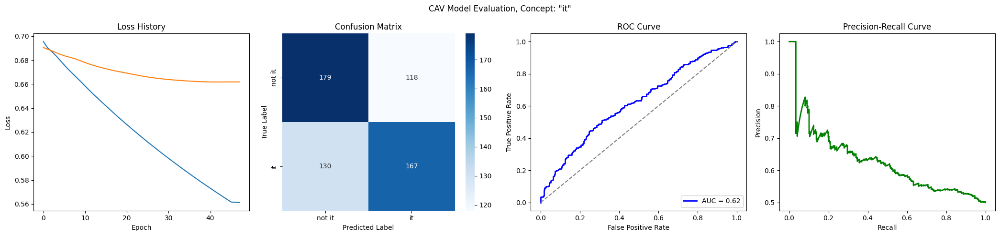

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6599
Epoch 11 Validation Loss: 0.6786
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6270
Epoch 21 Validation Loss: 0.6636
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5973
Epoch 31 Validation Loss: 0.6519
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5708
Epoch 41 Validation Loss: 0.6428
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5469
Epoch 51 Validation Loss: 0.6356
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5254
Epoch 61 Validation Loss: 0.6299
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5057
Epoch 71 Validation Loss: 0.6253
Model saved to trai

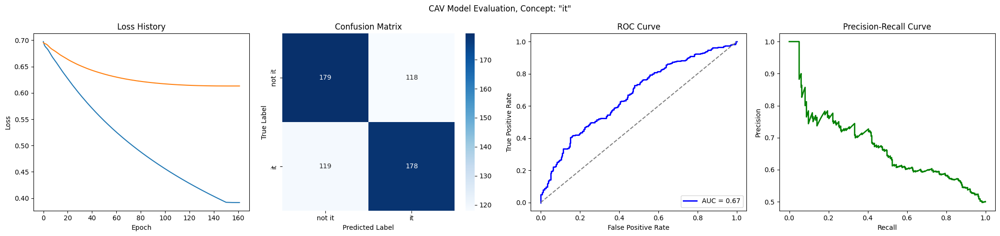

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6532
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6184
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5901
Epoch 31 Validation Loss: 0.6754
Early stopping at epoch 34
Loss history saved to trainings/language_it/loss_history.json


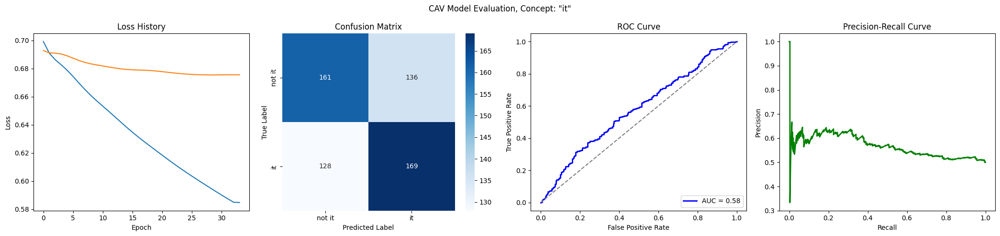

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7012
Epoch 1 Validation Loss: 0.6868
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6609
Epoch 11 Validation Loss: 0.6751
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6279
Epoch 21 Validation Loss: 0.6658
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5997
Epoch 31 Validation Loss: 0.6581
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5749
Epoch 41 Validation Loss: 0.6511
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5528
Epoch 51 Validation Loss: 0.6454
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5330
Epoch 61 Validation Loss: 0.6414
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5151
Epoch 71 Validation Loss: 0.6388
Model saved to trai

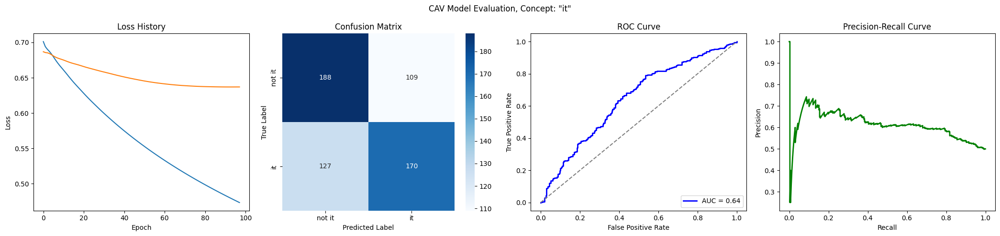

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6519
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6173
Epoch 21 Validation Loss: 0.6594
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5885
Epoch 31 Validation Loss: 0.6504
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5637
Epoch 41 Validation Loss: 0.6450
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5420
Epoch 51 Validation Loss: 0.6421
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5228
Epoch 61 Validation Loss: 0.6407
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5055
Epoch 71 Validation Loss: 0.6402
Model saved to trai

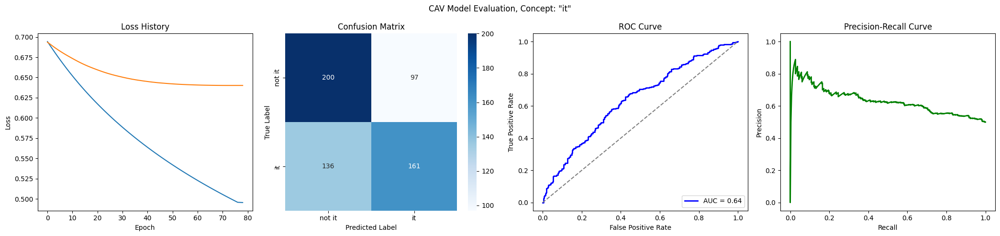

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6199
Epoch 21 Validation Loss: 0.6605
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5928
Epoch 31 Validation Loss: 0.6517
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5696
Epoch 41 Validation Loss: 0.6459
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5491
Epoch 51 Validation Loss: 0.6423
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5306
Epoch 61 Validation Loss: 0.6400
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5138
Epoch 71 Validation Loss: 0.6386
Model saved to trai

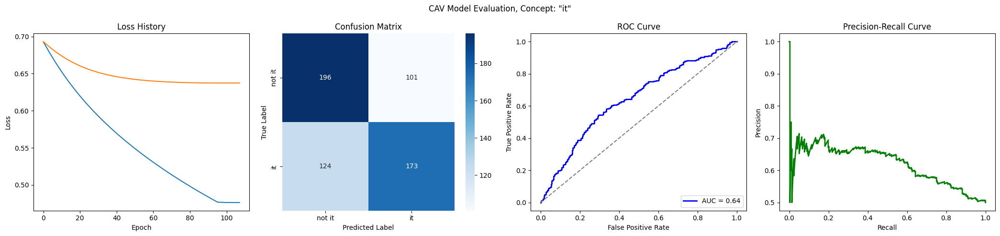

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6489
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6092
Epoch 21 Validation Loss: 0.6708
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5764
Epoch 31 Validation Loss: 0.6645
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5484
Epoch 41 Validation Loss: 0.6603
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5243
Epoch 51 Validation Loss: 0.6582
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5048
Epoch 61 Validation Loss: 0.6578
Early stopping at epoch 63
Loss history saved to trainings/language_it/loss_history.json


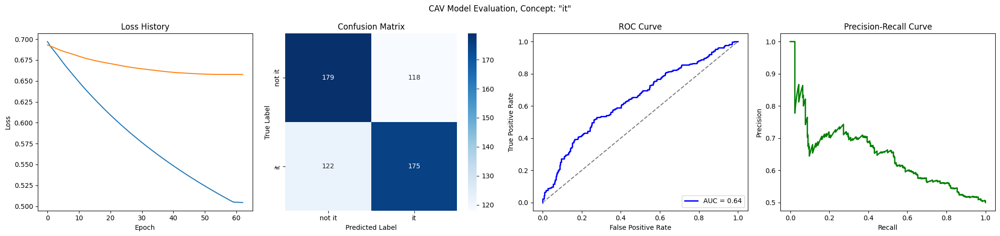

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7009
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6642
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6372
Epoch 21 Validation Loss: 0.6755
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6123
Epoch 31 Validation Loss: 0.6680
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5898
Epoch 41 Validation Loss: 0.6622
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5695
Epoch 51 Validation Loss: 0.6578
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5510
Epoch 61 Validation Loss: 0.6545
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5340
Epoch 71 Validation Loss: 0.6524
Model saved to trai

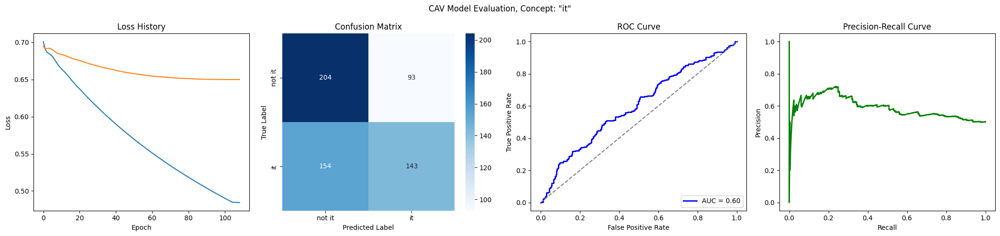

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6413
Epoch 11 Validation Loss: 0.6743
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5984
Epoch 21 Validation Loss: 0.6618
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5626
Epoch 31 Validation Loss: 0.6550
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5322
Epoch 41 Validation Loss: 0.6521
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5061
Epoch 51 Validation Loss: 0.6516
Early stopping at epoch 53
Loss history saved to trainings/language_it/loss_history.json


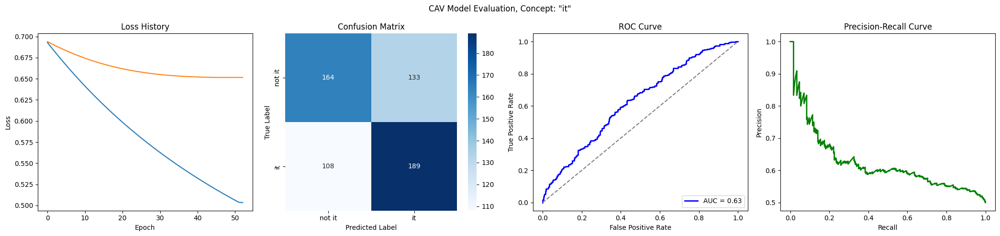

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6558
Epoch 11 Validation Loss: 0.6774
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6200
Epoch 21 Validation Loss: 0.6654
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5900
Epoch 31 Validation Loss: 0.6566
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5641
Epoch 41 Validation Loss: 0.6501
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5416
Epoch 51 Validation Loss: 0.6461
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5218
Epoch 61 Validation Loss: 0.6447
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_it/loss_history.json


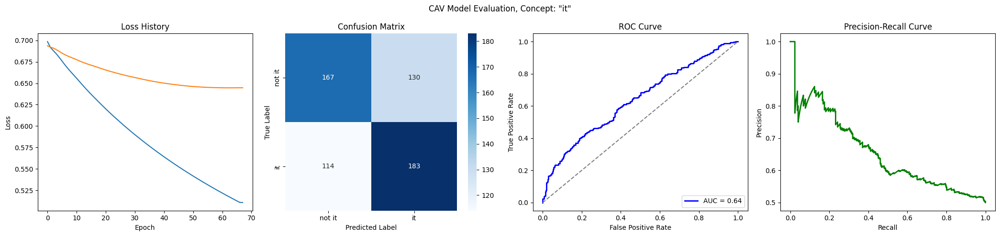

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6701
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6148
Epoch 21 Validation Loss: 0.6538
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5836
Epoch 31 Validation Loss: 0.6410
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5568
Epoch 41 Validation Loss: 0.6311
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5334
Epoch 51 Validation Loss: 0.6233
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5128
Epoch 61 Validation Loss: 0.6171
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4944
Epoch 71 Validation Loss: 0.6121
Model saved to trai

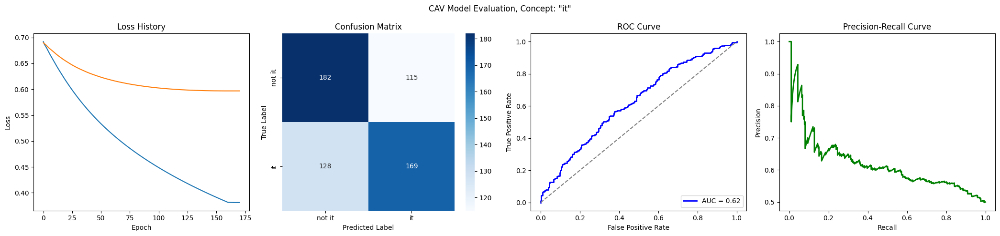

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6422
Epoch 11 Validation Loss: 0.6667
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5996
Epoch 21 Validation Loss: 0.6518
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5656
Epoch 31 Validation Loss: 0.6424
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5379
Epoch 41 Validation Loss: 0.6364
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5147
Epoch 51 Validation Loss: 0.6324
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4946
Epoch 61 Validation Loss: 0.6298
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4768
Epoch 71 Validation Loss: 0.6280
Model saved to trai

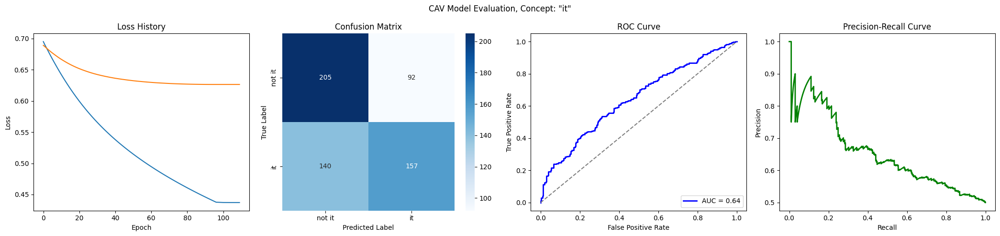

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6465
Epoch 11 Validation Loss: 0.6655
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6054
Epoch 21 Validation Loss: 0.6471
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5708
Epoch 31 Validation Loss: 0.6328
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5414
Epoch 41 Validation Loss: 0.6216
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5162
Epoch 51 Validation Loss: 0.6128
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4941
Epoch 61 Validation Loss: 0.6059
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4744
Epoch 71 Validation Loss: 0.6005
Model saved to trai

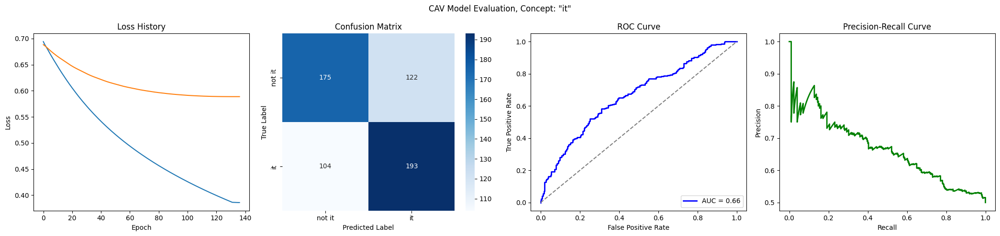

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6898
Epoch 1 Validation Loss: 0.6882
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6640
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6149
Epoch 21 Validation Loss: 0.6468
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5866
Epoch 31 Validation Loss: 0.6356
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5622
Epoch 41 Validation Loss: 0.6284
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5405
Epoch 51 Validation Loss: 0.6238
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5210
Epoch 61 Validation Loss: 0.6209
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5030
Epoch 71 Validation Loss: 0.6191
Model saved to trai

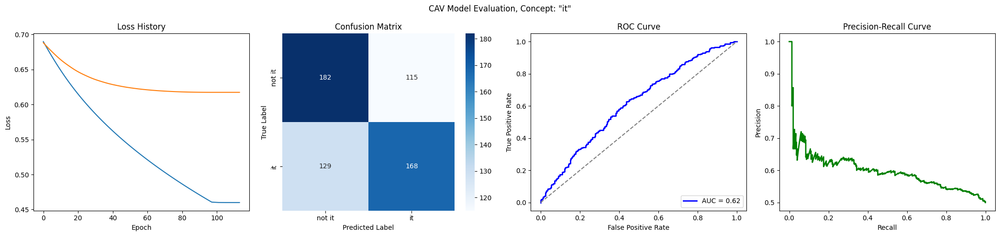

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6518
Epoch 11 Validation Loss: 0.6685
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6156
Epoch 21 Validation Loss: 0.6513
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5846
Epoch 31 Validation Loss: 0.6395
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5577
Epoch 41 Validation Loss: 0.6319
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5339
Epoch 51 Validation Loss: 0.6270
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5125
Epoch 61 Validation Loss: 0.6238
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4931
Epoch 71 Validation Loss: 0.6218
Model saved to trai

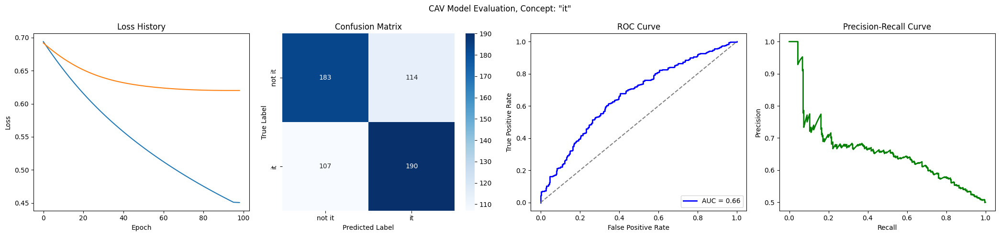

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6518
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6155
Epoch 21 Validation Loss: 0.6676
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5837
Epoch 31 Validation Loss: 0.6612
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5558
Epoch 41 Validation Loss: 0.6574
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5312
Epoch 51 Validation Loss: 0.6556
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5131
Epoch 61 Validation Loss: 0.6554
Early stopping at epoch 62
Loss history saved to trainings/language_it/loss_history.json


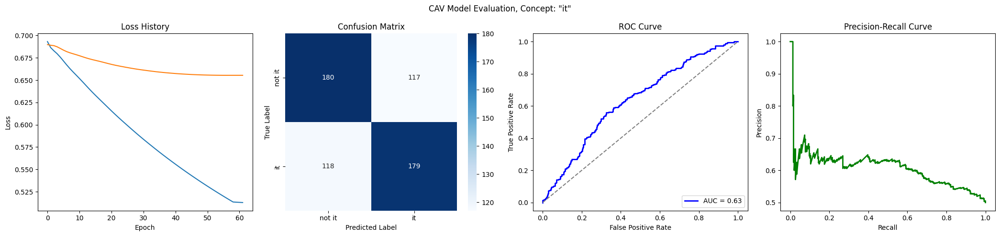

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6690
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6110
Epoch 21 Validation Loss: 0.6522
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5795
Epoch 31 Validation Loss: 0.6396
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5530
Epoch 41 Validation Loss: 0.6303
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5303
Epoch 51 Validation Loss: 0.6236
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5103
Epoch 61 Validation Loss: 0.6187
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4926
Epoch 71 Validation Loss: 0.6152
Model saved to trai

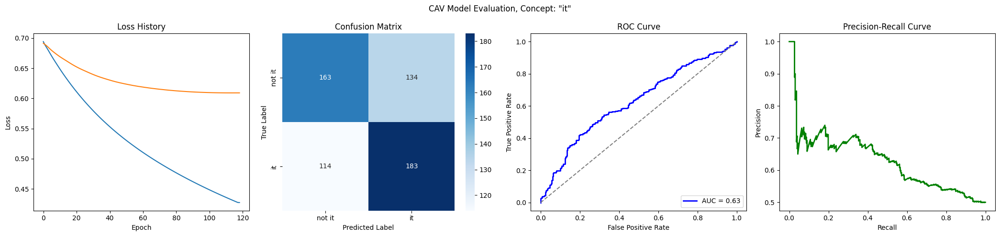

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6500
Epoch 11 Validation Loss: 0.6702
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6140
Epoch 21 Validation Loss: 0.6527
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5829
Epoch 31 Validation Loss: 0.6396
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5556
Epoch 41 Validation Loss: 0.6300
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5317
Epoch 51 Validation Loss: 0.6234
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5103
Epoch 61 Validation Loss: 0.6191
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4911
Epoch 71 Validation Loss: 0.6162
Model saved to trai

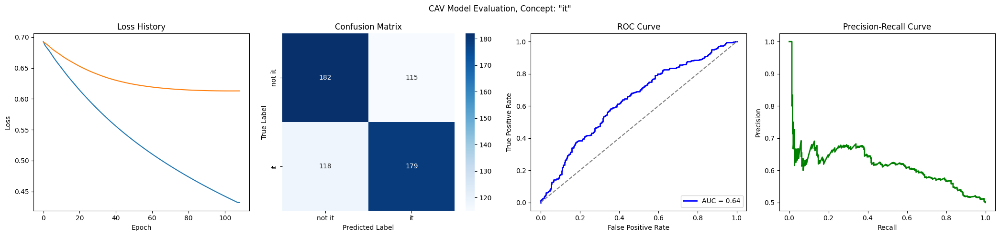

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6470
Epoch 11 Validation Loss: 0.6730
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6080
Epoch 21 Validation Loss: 0.6617
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5752
Epoch 31 Validation Loss: 0.6549
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5472
Epoch 41 Validation Loss: 0.6508
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5229
Epoch 51 Validation Loss: 0.6487
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5014
Epoch 61 Validation Loss: 0.6477
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4839
Epoch 71 Validation Loss: 0.6476
Early stopping at e

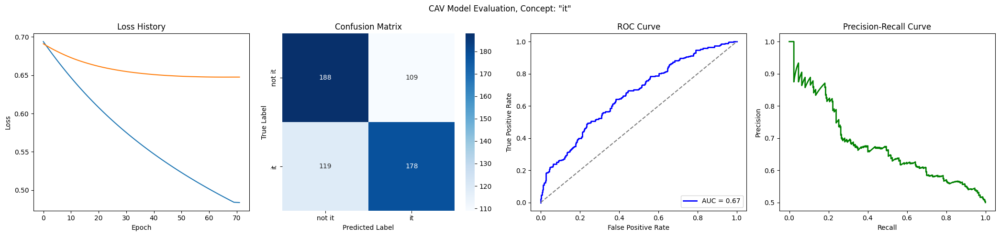

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6602
Epoch 11 Validation Loss: 0.6768
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6267
Epoch 21 Validation Loss: 0.6640
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5985
Epoch 31 Validation Loss: 0.6559
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5742
Epoch 41 Validation Loss: 0.6499
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5529
Epoch 51 Validation Loss: 0.6458
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5341
Epoch 61 Validation Loss: 0.6428
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5171
Epoch 71 Validation Loss: 0.6404
Model saved to trai

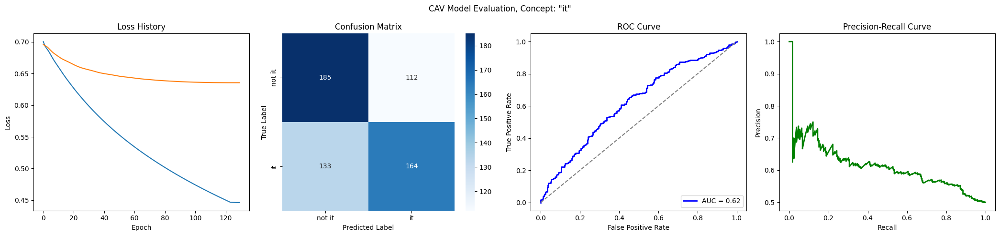

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6560
Epoch 11 Validation Loss: 0.6731
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6245
Epoch 21 Validation Loss: 0.6612
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5986
Epoch 31 Validation Loss: 0.6524
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5765
Epoch 41 Validation Loss: 0.6450
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5570
Epoch 51 Validation Loss: 0.6390
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5396
Epoch 61 Validation Loss: 0.6343
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5236
Epoch 71 Validation Loss: 0.6310
Model saved to trai

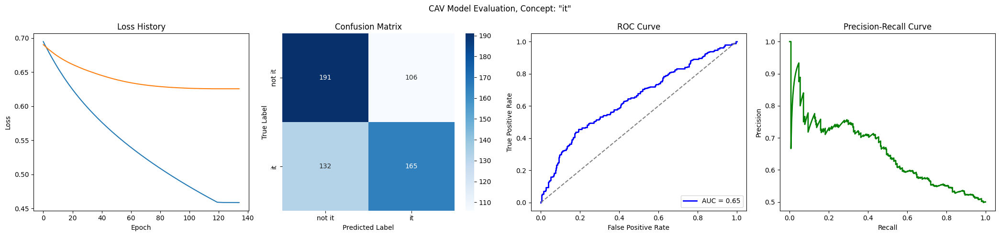

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6505
Epoch 11 Validation Loss: 0.6721
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6140
Epoch 21 Validation Loss: 0.6615
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5824
Epoch 31 Validation Loss: 0.6552
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5548
Epoch 41 Validation Loss: 0.6520
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5304
Epoch 51 Validation Loss: 0.6510
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/language_it/loss_history.json


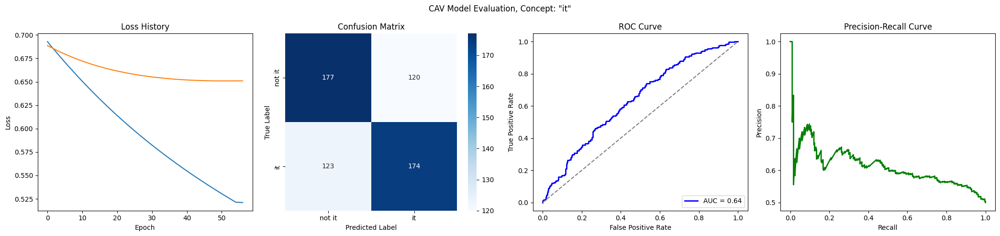

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7038
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6506
Epoch 11 Validation Loss: 0.6768
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6113
Epoch 21 Validation Loss: 0.6683
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5780
Epoch 31 Validation Loss: 0.6610
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5500
Epoch 41 Validation Loss: 0.6570
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5262
Epoch 51 Validation Loss: 0.6534
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5056
Epoch 61 Validation Loss: 0.6510
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4875
Epoch 71 Validation Loss: 0.6495
Model saved to trai

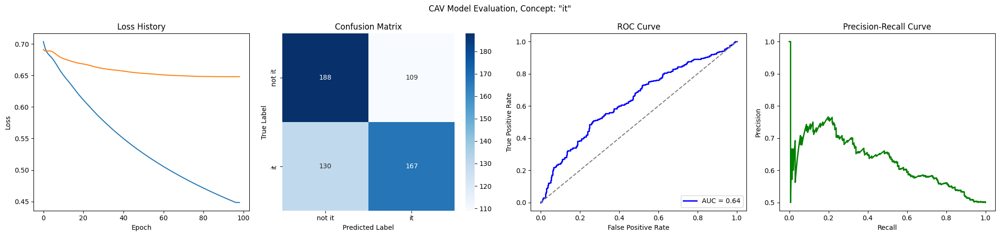

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6451
Epoch 11 Validation Loss: 0.6659
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6063
Epoch 21 Validation Loss: 0.6437
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5736
Epoch 31 Validation Loss: 0.6257
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5460
Epoch 41 Validation Loss: 0.6117
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5224
Epoch 51 Validation Loss: 0.6009
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5020
Epoch 61 Validation Loss: 0.5928
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4841
Epoch 71 Validation Loss: 0.5867
Model saved to trai

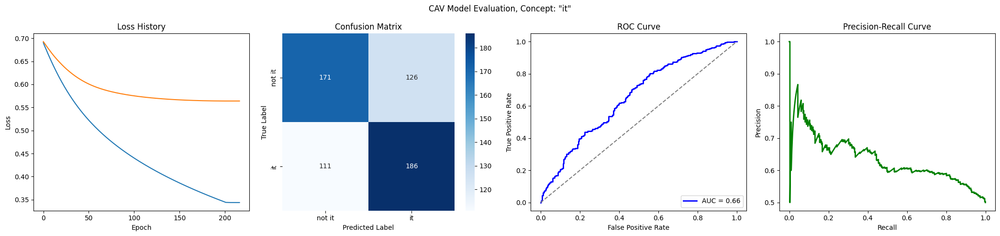

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6530
Epoch 11 Validation Loss: 0.6731
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6167
Epoch 21 Validation Loss: 0.6600
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5859
Epoch 31 Validation Loss: 0.6513
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5594
Epoch 41 Validation Loss: 0.6463
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5366
Epoch 51 Validation Loss: 0.6442
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5182
Epoch 61 Validation Loss: 0.6440
Early stopping at epoch 61
Loss history saved to trainings/language_it/loss_history.json


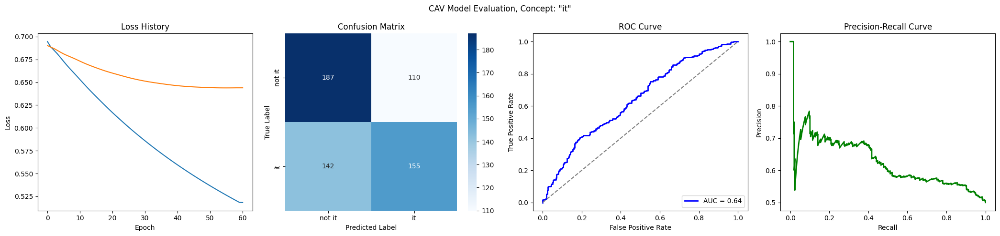

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7014
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6549
Epoch 11 Validation Loss: 0.6713
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6149
Epoch 21 Validation Loss: 0.6553
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5805
Epoch 31 Validation Loss: 0.6431
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5510
Epoch 41 Validation Loss: 0.6345
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5253
Epoch 51 Validation Loss: 0.6289
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5027
Epoch 61 Validation Loss: 0.6256
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4824
Epoch 71 Validation Loss: 0.6238
Model saved to trai

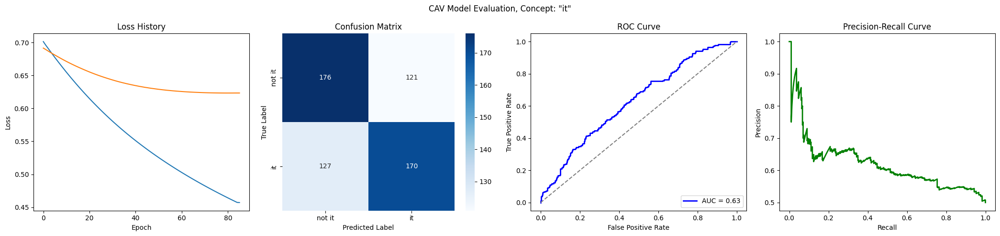

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6886
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6415
Epoch 11 Validation Loss: 0.6694
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6016
Epoch 21 Validation Loss: 0.6557
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5679
Epoch 31 Validation Loss: 0.6457
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5391
Epoch 41 Validation Loss: 0.6385
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5141
Epoch 51 Validation Loss: 0.6335
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4921
Epoch 61 Validation Loss: 0.6301
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4725
Epoch 71 Validation Loss: 0.6280
Model saved to trai

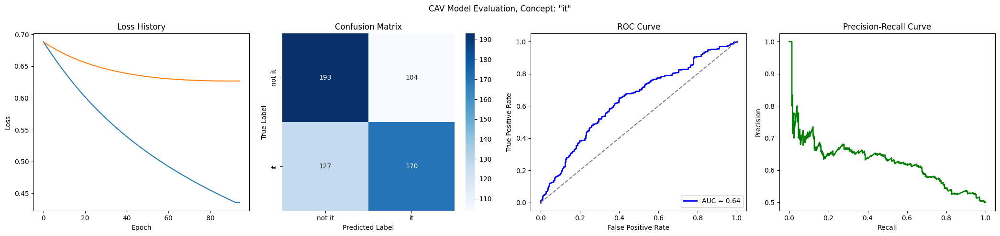

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6539
Epoch 11 Validation Loss: 0.6637
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6176
Epoch 21 Validation Loss: 0.6438
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5865
Epoch 31 Validation Loss: 0.6291
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5593
Epoch 41 Validation Loss: 0.6184
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5353
Epoch 51 Validation Loss: 0.6108
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5137
Epoch 61 Validation Loss: 0.6054
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4941
Epoch 71 Validation Loss: 0.6019
Model saved to trai

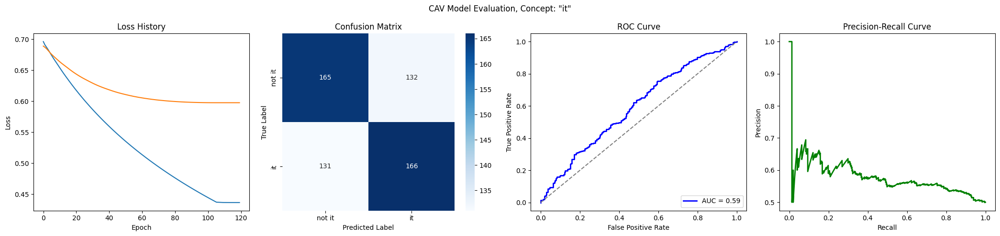

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6719
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6172
Epoch 21 Validation Loss: 0.6549
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5868
Epoch 31 Validation Loss: 0.6411
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5611
Epoch 41 Validation Loss: 0.6303
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5389
Epoch 51 Validation Loss: 0.6219
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5195
Epoch 61 Validation Loss: 0.6154
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5021
Epoch 71 Validation Loss: 0.6104
Model saved to trai

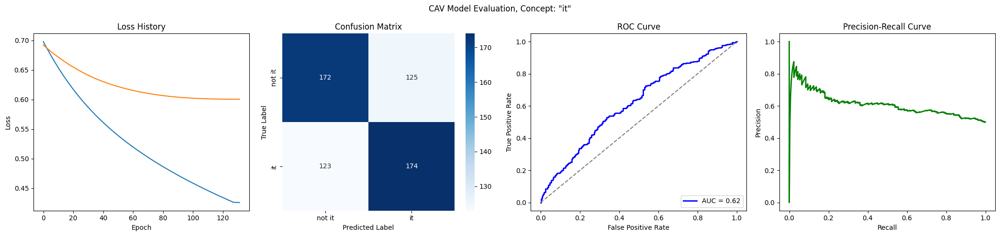

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6763
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6094
Epoch 21 Validation Loss: 0.6647
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5763
Epoch 31 Validation Loss: 0.6580
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5485
Epoch 41 Validation Loss: 0.6545
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5245
Epoch 51 Validation Loss: 0.6529
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5034
Epoch 61 Validation Loss: 0.6521
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4846
Epoch 71 Validation Loss: 0.6516
Model saved to trai

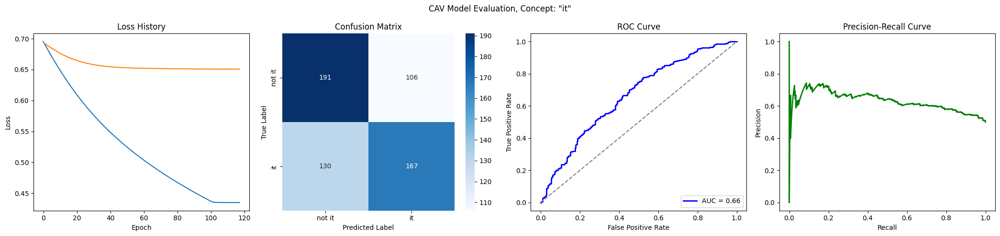

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6518
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6141
Epoch 21 Validation Loss: 0.6569
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5821
Epoch 31 Validation Loss: 0.6454
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5545
Epoch 41 Validation Loss: 0.6374
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5304
Epoch 51 Validation Loss: 0.6321
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5090
Epoch 61 Validation Loss: 0.6287
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4898
Epoch 71 Validation Loss: 0.6265
Model saved to trai

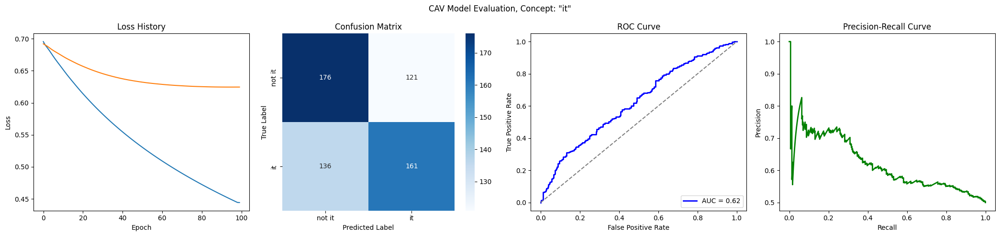

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6707
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6104
Epoch 21 Validation Loss: 0.6527
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5772
Epoch 31 Validation Loss: 0.6389
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5490
Epoch 41 Validation Loss: 0.6286
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5247
Epoch 51 Validation Loss: 0.6210
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5032
Epoch 61 Validation Loss: 0.6153
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4840
Epoch 71 Validation Loss: 0.6110
Model saved to trai

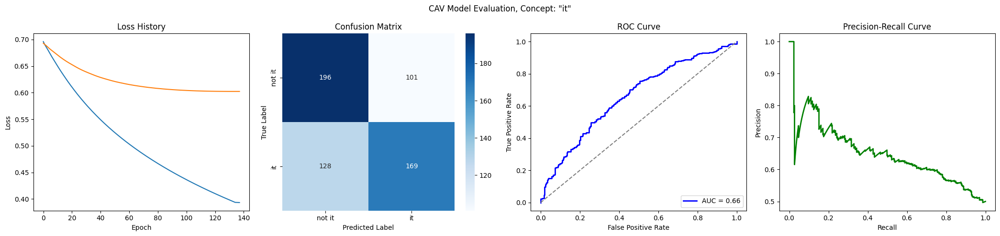

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6575
Epoch 11 Validation Loss: 0.6758
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6257
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5983
Epoch 31 Validation Loss: 0.6530
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5746
Epoch 41 Validation Loss: 0.6474
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5536
Epoch 51 Validation Loss: 0.6443
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5348
Epoch 61 Validation Loss: 0.6427
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5177
Epoch 71 Validation Loss: 0.6422
Model saved to trai

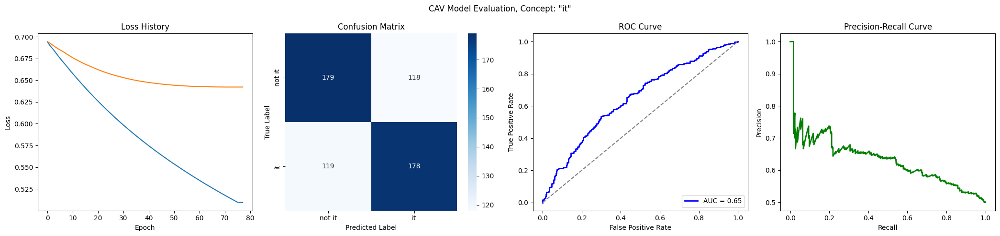

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6473
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6101
Epoch 21 Validation Loss: 0.6764
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5784
Epoch 31 Validation Loss: 0.6754
Early stopping at epoch 34
Loss history saved to trainings/language_it/loss_history.json


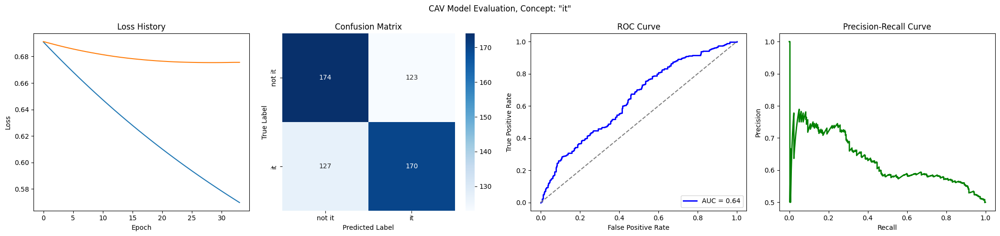

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6560
Epoch 11 Validation Loss: 0.6847
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6206
Epoch 21 Validation Loss: 0.6780
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5893
Epoch 31 Validation Loss: 0.6726
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5618
Epoch 41 Validation Loss: 0.6681
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5374
Epoch 51 Validation Loss: 0.6650
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5156
Epoch 61 Validation Loss: 0.6637
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 69
Loss history saved to trainings/language_it/loss_history.json


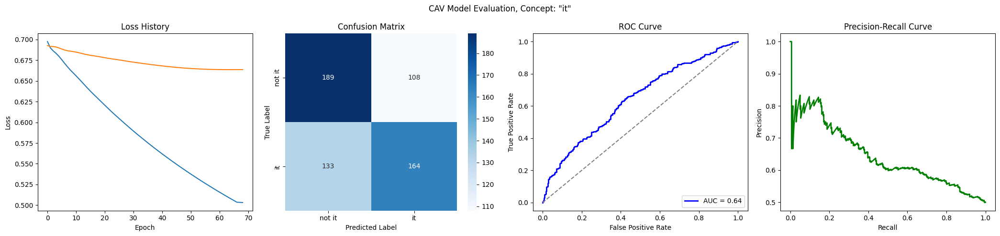

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6463
Epoch 11 Validation Loss: 0.6669
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6074
Epoch 21 Validation Loss: 0.6493
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5754
Epoch 31 Validation Loss: 0.6370
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5486
Epoch 41 Validation Loss: 0.6286
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5257
Epoch 51 Validation Loss: 0.6229
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5059
Epoch 61 Validation Loss: 0.6192
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4883
Epoch 71 Validation Loss: 0.6167
Model saved to trai

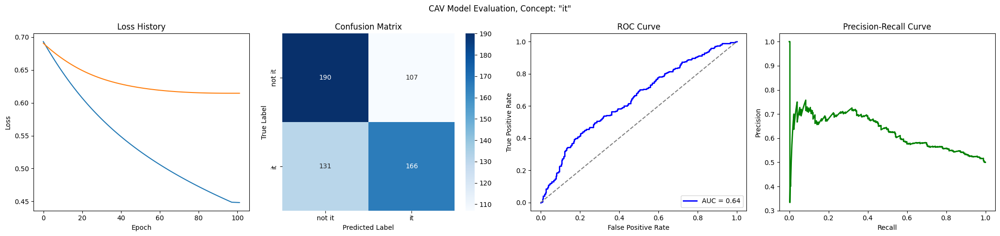

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6767
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6224
Epoch 21 Validation Loss: 0.6645
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5927
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5667
Epoch 41 Validation Loss: 0.6495
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5439
Epoch 51 Validation Loss: 0.6463
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5236
Epoch 61 Validation Loss: 0.6452
Model saved to trainings/language_it/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_it/loss_history.json


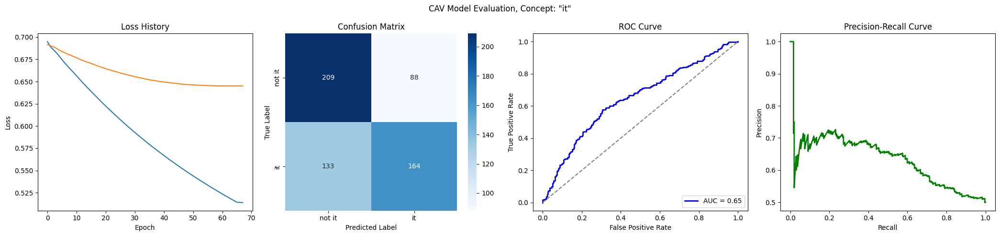

CPU times: user 14min 24s, sys: 11min 49s, total: 26min 13s
Wall time: 2h 23min 36s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

289

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


2595 289
Epoch 1/500
Epoch 1 Train Loss: 0.6777
Epoch 1 Validation Loss: 0.6561
Model saved to trainings/language_it/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5742
Epoch 11 Validation Loss: 0.5813
Model saved to trainings/language_it/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5455
Epoch 21 Validation Loss: 0.5680
Model saved to trainings/language_it/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5271
Epoch 31 Validation Loss: 0.5607
Model saved to trainings/language_it/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5136
Epoch 41 Validation Loss: 0.5562
Model saved to trainings/language_it/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5030
Epoch 51 Validation Loss: 0.5533
Model saved to trainings/language_it/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4944
Epoch 61 Validation Loss: 0.5515
Model saved to trainings/language_it/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4871
Epoch 71 Validation Loss: 0.5503
Model saved to trainings/language_it/s

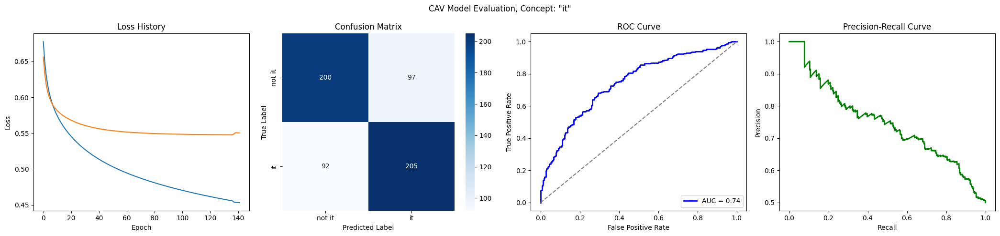

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
